# Hybrid Gait Day 12 — Four-Leg Whole-Body Integration

**這份 notebook 是 Day 12 的進度展示。** 規格與 task list 在
`day12/hybrid_gait_day12_whole_body_integration_zh_TW.md`；
每一步實際做了什麼、停在哪裡，記在
`day12/day12_implementation_log_zh_TW.md`（新對話請先讀那一份）。

Day 12 要解的問題：

> Given per-leg terrain-transition motion sequences, construct a synchronized
> four-leg whole-body trajectory that satisfies contact, collision,
> body-motion, timing, and basic quasi-static support constraints.

輸入是 Day 10–11 的交付物（`day10_11_step9_body_requirements.csv`，392 列），
**Day 12 不重做 ROLL/SWING 的決策**。

> **2026-09-01 規劃更新（FINAL FREEZE）**：規格 §0.2 取消了「平地可以永遠連續接觸、
> 完全不需要 swing」這個假設。平地 nominal locomotion 現在正式定義為一個**循環**：
> ```text
> NOMINAL_HYBRID_CYCLE = FOOT_RIM_ROLL + RECOVERY_SWING
> ```
> 同時 §0.1 要求 planner 對地形**參數化**——`4 cm / 10 cm / 19 cm` 只是 evaluation
> query，不得寫進 decision rule。這兩點都已反映在下面的 Step 0 與 Step 1。

| Step | 內容 | 狀態 |
|---|---|---|
| **0** | Freeze segment semantics / chain 介面 | ✅ 完成 |
| **1** | Nominal flat-ground Hybrid cycle | ✅ 完成 |
| **2** | 四腳 world-frame 初始化與地形註冊 | ✅ 完成 |
| **3** | 四腳 timing skeleton | ✅ 完成 |
| **4** | per-leg sequence 映射到共同時間軸 | ✅ 完成 |
| **5** | body requirement → whole-body trajectory | ✅ 完成（結論是 INFEASIBLE） |
| **6** | 三腳 support triangle + CoM margin | ✅ 完成（結論是 UNSTABLE） |
| **7** | `TOP_REPOSITION` resolution | ✅ 完成（planning floor 下 support 不足） |
| **8** | 完整四腳 joint/contact trajectory | ✅ 完成（疊在三個未解結論上） |
| **9** | Whole-body validation | ✅ 完成（11 檢查 7 過 4 失） |
| **10** | 參數化地形整合 + generalization gate | ✅ 完成 |
| **11** | Paper metrics | ✅ 完成 |
| 12 | Freeze + Day 13–14 handoff | ⬜ |

In [4]:
import sys, os, csv
from dataclasses import replace
from pathlib import Path

ROOT = Path.cwd()
while ROOT.name != "LegWheel" and ROOT != ROOT.parent:
    ROOT = ROOT.parent
if str(ROOT.parent) not in sys.path:
    sys.path.insert(0, str(ROOT.parent))
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

import matplotlib
# Implementation-log trap 11: nbclient needs the inline backend named
# explicitly, or every figure silently becomes an "Agg is non-interactive"
# warning and no image is produced.
matplotlib.use("module://matplotlib_inline.backend_inline")
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import Image, display

pd.set_option("display.width", 160)
pd.set_option("display.max_colwidth", 78)

NOTES = ROOT / "hybrid_note" / "notes"
DAY12 = NOTES / "day12"
print("LegWheel  ", ROOT)
print("day12 out ", DAY12)

LegWheel   /home/chang/corgi_ws/icra hybrid/LegWheel
day12 out  /home/chang/corgi_ws/icra hybrid/LegWheel/hybrid_note/notes/day12


---

# Step 0 — Freeze Day 12 Semantic Contract

規格 §7 要求：在寫任何四腳程式之前，先確定「平地 nominal locomotion 叫什麼」，
避免 Day 12 又被做回

```text
theta = 17 deg wheel mode → obstacle → walking → theta = 17 deg wheel mode
```

Step 0 給 AI 的指令有七項要求，加上一句「**改程式之前先報告現有類別與最小修改計畫**」。
下面是報告的結論與證據。

## 0.1 現有的東西

| 檔案 | 提供什麼 |
|---|---|
| `day10_11_motion_schema_2d.py` | `SegmentKind`、`PointContact2D`、`RollingContact2D`、`RollSampling2D` / `SwingSampling2D`、`BodyRequirement2D`、`FrameRef2D`、`MotionSegment2D`、`MotionSequence2D`、`TransitionRequirement2D` |
| `day10_11_sequence_builders_2d.py` | 兩個 builder ＋ `HandoffReport2D` / `handoff_report_2d` |
| `legwheel/planners/hybrid/types.py` | `RimId.FOOT / LEFT / RIGHT` |
| `legwheel/config/__init__.py` | `RobotParams.THETA0_DEG = 17.0` — wheel mode 的 theta，**專案既有常數** |

新增的只有一個模組：`day12_segment_contract_2d.py`，以及 `SegmentKind` 裡的一個成員。

## 0.2 `FOOT_RIM_ROLL` vs `WHEEL_ROLL`：這次是可以被機器檢查的

Day 10–11 的 `WHEEL_ROLL` docstring 寫的是「propulsion at `theta = 17 deg`」——
它**就是** wheel mode。2026-08-31 的新 freeze 說平地 nominal **不是** wheel mode。
所以兩者必須分開，而且分開的方式不能只是註解：註解會被讀者忽略，
enum 成員如果沒有被強制的意義，就會漂移成別的東西（Day 10–11 log 反覆踩到這一類錯）。

因此加了 property，讓「哪一個是 nominal、哪一個釘死 theta」變成可以 `assert` 的事實。

**2026-09-01 的規劃更新讓 Step 0 多做了一件事。** FINAL FREEZE 把平地 nominal 從
一個 segment 改成一個**循環**，所以 `SegmentKind` 還要有 `RECOVERY_SWING`，
而且 `is_nominal_locomotion` 從「只有 `FOOT_RIM_ROLL`」變成「`FOOT_RIM_ROLL` ＋
`RECOVERY_SWING`」——舊版那個單一成員的寫法，等於把「平地不需要 swing」這個
**已被取消的主張**寫進了程式。

同時新增 `is_terrain_transition`：規格 §18 要求 metrics 把
`nominal recovery swing count` 與 `terrain-transition swing count` **分開統計**，
因為 Hybrid vs Walk 的比較就靠「這個 swing 是 gait 本來就要做的，還是地形逼出來的」
這個區分。把 recovery 併進 `SWING_UP` 會在源頭就把它毀掉。

In [5]:
from hybrid_note.scripts.experiments.day10_11_motion_schema_2d import (
    WHEEL_MODE_THETA_RAD, SegmentKind,
)
from hybrid_note.scripts.experiments.day12_segment_contract_2d import (
    segment_semantics_rows,
)

semantics = pd.DataFrame(segment_semantics_rows())
display(semantics)

print(f"nominal locomotion  : "
      f"{[k.value for k in SegmentKind if k.is_nominal_locomotion]}")
print(f"pins theta to wheel : "
      f"{[k.value for k in SegmentKind if k.pins_theta]}"
      f"  (theta = {np.rad2deg(WHEEL_MODE_THETA_RAD):.0f} deg, "
      f"from RobotParams.THETA0_DEG)")
print("\nFOOT_RIM_ROLL != WHEEL_ROLL :",
      SegmentKind.FOOT_RIM_ROLL is not SegmentKind.WHEEL_ROLL)
print(f"nominal cycle       : "
      f"{[k.value for k in SegmentKind if k.is_nominal_locomotion]}")
print(f"terrain transitions : "
      f"{[k.value for k in SegmentKind if k.is_terrain_transition]}")

,kind,family,pins_theta_to_wheel_mode,is_nominal_locomotion,is_terrain_transition,meaning
0,FOOT_RIM_ROLL,rolling,False,True,False,"Nominal cycle, stance half: expanded posture, foot rim rolling along the u..."
1,RECOVERY_SWING,swing,False,True,False,"Nominal cycle, airborne half: liftoff, retract to a compact posture, carry..."
2,TOP_REPOSITION_SWING,swing,False,False,True,Day 12 Step 7: the airborne relocation on top of the obstacle that Day 10-...
3,WHEEL_ROLL,rolling,True,False,False,True wheel mode at theta = 17 deg. Only inside a transition that needs it...
4,APPROACH,rolling,False,False,True,"The run-up to a known transition. Same motion as FOOT_RIM_ROLL, but its n..."
5,ROLL_UP,rolling,False,False,True,Rolling onto the leading edge.
6,WHEEL_TRANSITION,rolling,False,False,True,Retract to wheel mode on the top.
7,ROLL_DOWN,rolling,False,False,True,Rolling off the trailing edge.
8,POST_TOUCHDOWN_ROLL,rolling,False,False,True,"Rolling on whichever rim a swing just landed on, bounded by the arc that r..."
9,SWING_UP,swing,False,False,True,Airborne onto the top.


nominal locomotion  : ['FOOT_RIM_ROLL', 'RECOVERY_SWING']
pins theta to wheel : ['WHEEL_ROLL']  (theta = 17 deg, from RobotParams.THETA0_DEG)

FOOT_RIM_ROLL != WHEEL_ROLL : True
nominal cycle       : ['FOOT_RIM_ROLL', 'RECOVERY_SWING']
terrain transitions : ['APPROACH', 'ROLL_UP', 'WHEEL_TRANSITION', 'ROLL_DOWN', 'SWING_UP', 'SWING_DOWN', 'SWING_OVER', 'TOP_REPOSITION_SWING', 'POST_TOUCHDOWN_ROLL']


### 兩個名字各自主張什麼——而且只主張那一件事

- `FOOT_RIM_ROLL` 主張**接觸在 foot rim**。它對 `theta` **不做任何主張**——
  擺脫 wheel mode 正是它存在的理由，在這裡加 theta 檢查等於把它要移除的東西加回去。
- `WHEEL_ROLL` 主張 `theta` 是 wheel mode。它對**哪一個 rim** 不做主張——
  在 17 deg 那是幾何的事，不是標籤的事。

下面把兩個違規各示範一次（都會被擋下來），再示範一次不該被擋的情況。

In [6]:
from hybrid_note.scripts.experiments.day10_11_concession_2d import BodyRequirementKind
from hybrid_note.scripts.experiments.day10_11_motion_schema_2d import (
    BodyRequirement2D, FrameRef2D, MotionSegment2D, PointContact2D,
    RollSampling2D, RollingContact2D,
)

NOMINAL_THETA = np.deg2rad(60.0)   # Day 6-7 approach 站的姿態，引用而非自訂

def roll_segment(kind=SegmentKind.FOOT_RIM_ROLL, *, rim="foot_rim",
                 theta=NOMINAL_THETA, source="day12_flat", indices=(0, 1, 2),
                 x_from=-0.10, x_to=-0.05, start=None, end=None):
    point = lambda x, a, b: PointContact2D(
        rim=rim, alpha_rad=np.deg2rad(a), point_world_xz_m=(x, 0.0),
        surface_id="ground", theta_rad=theta, beta_rad=np.deg2rad(b),
        hip_xz_m=(x, 0.2194))
    return MotionSegment2D(
        kind=kind, phase_label=kind.value,
        start_contact=start or point(x_from, 0.0, 0.0),
        end_contact=end or point(x_to, 18.0, -18.0),
        sampling=RollSampling2D(arc_samples=241,
                                beta_step_rad=np.deg2rad(-1.0), theta_step_rad=None),
        body_requirement=BodyRequirement2D(
            kind=BodyRequirementKind.TRACK, x_range_m=(x_from, x_to),
            hip_z_profile_m=np.full(len(indices), 0.2194)),
        frames=FrameRef2D(source_id=source, indices=indices),
        rolling=RollingContact2D(
            rim=rim, surface_ids=("ground",),
            alpha_range_rad=(0.0, np.deg2rad(18.0)),
            beta_range_rad=(np.deg2rad(-18.0), 0.0),
            theta_range_rad=(theta, theta),
            contact_start_xz_m=(x_from, 0.0), contact_end_xz_m=(x_to, 0.0)),
    )

def attempt(label, fn):
    try:
        fn()
        print(f"OK       {label}")
    except (ValueError, TypeError) as exc:
        print(f"REFUSED  {label}\n         -> {exc}")

attempt("FOOT_RIM_ROLL @ theta = 60 deg (the whole point)",
        lambda: roll_segment())
attempt("FOOT_RIM_ROLL rolling on the left rim",
        lambda: roll_segment(rim="left_rim"))
attempt("WHEEL_ROLL @ theta = 60 deg (an expanded run mislabelled)",
        lambda: roll_segment(kind=SegmentKind.WHEEL_ROLL))
attempt("WHEEL_ROLL @ theta = 17 deg (true wheel mode)",
        lambda: roll_segment(kind=SegmentKind.WHEEL_ROLL, theta=WHEEL_MODE_THETA_RAD))
attempt("POST_TOUCHDOWN_ROLL on the left rim (left rim is not forbidden)",
        lambda: roll_segment(kind=SegmentKind.POST_TOUCHDOWN_ROLL, rim="left_rim"))

OK       FOOT_RIM_ROLL @ theta = 60 deg (the whole point)
REFUSED  FOOT_RIM_ROLL rolling on the left rim
         -> FOOT_RIM_ROLL asserts the foot rim is the rolling contact; this segment rolls on left_rim.  Use POST_TOUCHDOWN_ROLL for rolling on whichever rim a swing landed on.
REFUSED  WHEEL_ROLL @ theta = 60 deg (an expanded run mislabelled)
         -> WHEEL_ROLL means true wheel mode (theta = 17 deg), but this segment holds theta in [60.0, 60.0] deg.  An expanded-posture flat run is FOOT_RIM_ROLL, not WHEEL_ROLL.
OK       WHEEL_ROLL @ theta = 17 deg (true wheel mode)
OK       POST_TOUCHDOWN_ROLL on the left rim (left rim is not forbidden)


## 0.3 Step 0 的第一個發現：這個運動**已經存在**，缺的只是名字

Day 6–7 Step 10R 的第一段 `APPROACH`，就是一條平地 foot-rim rolling：
`rim = foot_rim`、`mode = surface roll`、`theta` 固定在 60 deg、接觸點沿 `ground` 前進。

`APPROACH` 不能直接拿來當 nominal locomotion，因為**它的名字主張前面有障礙物**。
平地 nominal 沒有障礙物。所以兩個 kind 並存，而 `FOOT_RIM_ROLL` **不需要任何新幾何**——
把 `APPROACH` 改標成 `FOOT_RIM_ROLL`，schema 檢查的每一項都不變。這就是證據。

In [7]:
from hybrid_note.scripts.experiments.day10_11_sequence_builders_2d import (
    sequence_from_traversal_frames_2d,
)

SOURCE_ID = "day6_7_step10r_full_traversal_frames.csv"
with (NOTES / "day6-7" / SOURCE_ID).open(newline="") as fh:
    day6_7_rows = list(csv.DictReader(fh))

sequence = sequence_from_traversal_frames_2d(
    day6_7_rows, terrain_id="day6_7_obstacle", source_id=SOURCE_ID, arc_samples=241)
approach = sequence.segments[0]

print(f"kind          {approach.kind.value}")
print(f"rim           {approach.rolling.rim.value}")
print(f"surfaces      {approach.rolling.surface_ids}")
print(f"rolling mode  {approach.rolling.mode.value}")
print(f"theta         {np.rad2deg(approach.rolling.theta_range_rad[0]):.1f} deg "
      f"-> {np.rad2deg(approach.rolling.theta_range_rad[1]):.1f} deg   "
      f"(wheel mode is {np.rad2deg(WHEEL_MODE_THETA_RAD):.0f} deg)")
print(f"beta sweep    {np.rad2deg(approach.rolling.beta_sweep_rad):.2f} deg")
print(f"contact x     {approach.rolling.contact_start_xz_m[0]*1e3:.1f} mm "
      f"-> {approach.rolling.contact_end_xz_m[0]*1e3:.1f} mm")

relabelled = replace(approach, kind=SegmentKind.FOOT_RIM_ROLL)
print(f"\nrelabelled -> {relabelled.kind.value}, "
      f"is_nominal_locomotion = {relabelled.kind.is_nominal_locomotion}")
print(f"rolling description unchanged: {relabelled.rolling == approach.rolling}")

kind          APPROACH
rim           foot_rim
surfaces      ('ground',)
rolling mode  surface roll
theta         60.0 deg -> 60.0 deg   (wheel mode is 17 deg)
beta sweep    17.84 deg
contact x     -100.0 mm -> -54.4 mm

relabelled -> FOOT_RIM_ROLL, is_nominal_locomotion = True
rolling description unchanged: True


## 0.4 Step 0 的第二個發現：`MotionSequence2D` 串不起 Day 12 要串的東西

這是 Step 0 唯一真正的阻塞點，而且不是加一個 enum 成員能解決的。

`MotionSequence2D.__post_init__` 強制兩件事：

1. 所有 segment 共用同一個 `frames.source_id`；
2. frame index 跨 segment 不得重複。

對「從一條 traversal 裡切出來的 sequence」來說這兩條都是**真正的保證**，Step 7 靠它們做交接檢查。
但 Day 12 一條腿的軌跡是：

```text
平地 FOOT_RIM_ROLL   (Day 12 產生器)
      ↓
Day 6-7 traversal    (day6_7_step10r_full_traversal_frames.csv)
      ↓
Day 8-9 swing        (它自己的 sample index)
```

**三個來源，index 從 0 各數各的，一定互撞。**

放寬 `MotionSequence2D` 會拿掉 Day 10–11 已經賺到的保證，所以 Day 12 用自己的容器
`SegmentChain2D`，並且**保留仍然成立的那條規則**：同一個來源之內，一個 frame 只屬於一段。

In [8]:
from hybrid_note.scripts.experiments.day10_11_motion_schema_2d import MotionSequence2D
from hybrid_note.scripts.experiments.day12_segment_contract_2d import (
    SegmentChain2D, exit_state_2d,
)

flat = roll_segment(source="day12_flat", indices=(0, 1, 2))
transition = roll_segment(kind=SegmentKind.ROLL_UP, source="day6_7_step10r",
                          indices=(0, 1, 2), start=exit_state_2d(flat))

attempt("MotionSequence2D over two frame sources",
        lambda: MotionSequence2D(terrain_id="t", segments=(flat, transition)))
attempt("SegmentChain2D over two frame sources",
        lambda: SegmentChain2D(leg_id="LF", segments=(flat, transition)))

replayed = roll_segment(source="day12_flat", indices=(2, 3, 4),
                        start=exit_state_2d(flat))
attempt("SegmentChain2D reusing frame 2 within one source",
        lambda: SegmentChain2D(leg_id="LF", segments=(flat, replayed)))

REFUSED  MotionSequence2D over two frame sources
         -> every segment of one sequence must reference the same frame source; got ['day12_flat', 'day6_7_step10r'].
OK       SegmentChain2D over two frame sources
REFUSED  SegmentChain2D reusing frame 2 within one source
         -> segments of leg 'LF' overlap on frames [2] of source 'day12_flat': within one source a frame belongs to exactly one segment.


## 0.5 Step 0 的第三個發現：一個 boundary 有兩種，資料自己逼出來的

`SegmentChain2D` 的第一版對每個 boundary 用同一組容忍值（joint 2 deg、hip 2 mm）。
**Day 6–7 自己的 traversal 有 5 個 boundary 過不了。**

那不是 traversal 不連續，是**容忍值問對了問題、用錯了地方**：

- `day10_11_sequence_builders_2d` 是在 `(stage, phase)` 改變的地方**切**一條連續驗證過的 run，
  所以相鄰兩段拿的是**相鄰的 frame**——中間的「跳躍」是**一步真實的滾動**，
  實測最大 beta 1.75 deg、hip **6.62 mm**。
- Day 12 才出現的另一種 boundary 是：兩個**各自獨立產生**的運動接在一起。
  這裡腿真的可能瞬移，而且從來沒有人檢查過。

用同一個門檻同時服務兩者，一定有一邊是錯的：
鬆到容得下 cut 就會放過瞬移，緊到擋得住瞬移就會否決 traversal 自己的切點。
**這正是 Day 10–11 log 反覆點名的那一類錯：為某個情況設計的量，套到不適用的情況上。**

所以分成 `BoundaryKind.CUT` 與 `BoundaryKind.HANDOVER`，各自檢查各自該檢查的事。

In [9]:
from hybrid_note.scripts.experiments.day12_segment_contract_2d import (
    BoundaryKind, ChainTolerance2D, boundary_kind_2d, boundary_rows_2d,
    chain_boundaries_2d,
)
from hybrid_note.scripts.experiments.day12_step0_driver import build_chain

chain = build_chain()
print(f"leg           {chain.leg_id}")
print(f"segments      {len(chain.segments)}")
print(f"sources       {chain.sources}")
print(f"is_chained    {chain.is_chained}")
print(f"is_complete   {chain.is_complete}")

rows = boundary_rows_2d(chain.segments, chain.tolerance)
table = pd.DataFrame(rows)[[
    "boundary_index", "boundary_kind", "frame_gap", "from", "to",
    "theta_jump_deg", "beta_jump_deg", "hip_jump_mm", "contact_jump_mm",
    "continuous",
]]
display(table.round(3))

leg           single_leg_2d
segments      11
sources       ('day12_step0_flat_run', 'day6_7_step10r_full_traversal_frames.csv')
is_chained    True
is_complete   True


,boundary_index,boundary_kind,frame_gap,from,to,theta_jump_deg,beta_jump_deg,hip_jump_mm,contact_jump_mm,continuous
0,0,handover,-2,FOOT_RIM_ROLL/NOMINAL_FLAT_RUN,APPROACH/APPROACH,0.0,0.000,0.000,0.000,True
1,1,cut,1,APPROACH/APPROACH,APPROACH/RIGHT_RIM_FRONT_CONTACT,0.0,-1.750,6.623,4.218,True
2,2,cut,2,APPROACH/RIGHT_RIM_FRONT_CONTACT,ROLL_UP/RIGHT_RIM_ROLL_UP,0.0,-1.000,3.547,180.468,True
3,3,cut,1,ROLL_UP/RIGHT_RIM_ROLL_UP,ROLL_UP/RIGHT_RIM_TOP,0.0,-0.500,1.498,1.464,True
4,4,cut,1,ROLL_UP/RIGHT_RIM_TOP,WHEEL_TRANSITION/RETRACT_TO_WHEEL,-1.0,-1.000,1.255,1.464,True
5,5,cut,1,WHEEL_TRANSITION/RETRACT_TO_WHEEL,WHEEL_TRANSITION/WHEEL_MODE_TOP_ROLL,-1.0,-1.000,0.639,0.000,True
6,6,cut,1,WHEEL_TRANSITION/WHEEL_MODE_TOP_ROLL,WHEEL_TRANSITION/LEFT_RIM_READY,0.0,-1.000,2.510,2.928,True
7,7,cut,1,WHEEL_TRANSITION/LEFT_RIM_READY,ROLL_DOWN/LEFT_RIM_TRAILING_TRANSITION,0.0,-1.000,5.549,3.039,True
8,8,cut,1,ROLL_DOWN/LEFT_RIM_TRAILING_TRANSITION,ROLL_DOWN/LEFT_RIM_ROLL_DOWN,0.0,-1.000,2.510,0.000,True
9,9,cut,1,ROLL_DOWN/LEFT_RIM_ROLL_DOWN,ROLL_DOWN/LOWER_GROUND_CONTACT,0.0,-0.173,0.434,169.723,True


boundaries        10  (1 hand-over, 9 cut)
max cut hip jump  6.623 mm   <- a fixed 2 mm bound would refuse 5 real cuts
max cut |dbeta|   1.75 deg
max cut |dtheta|  1.00 deg
max contact jump  180.5 mm  <- Day 10-11 trap 32: a change of chart at the +-180 deg seam, not a motion
all continuous    True


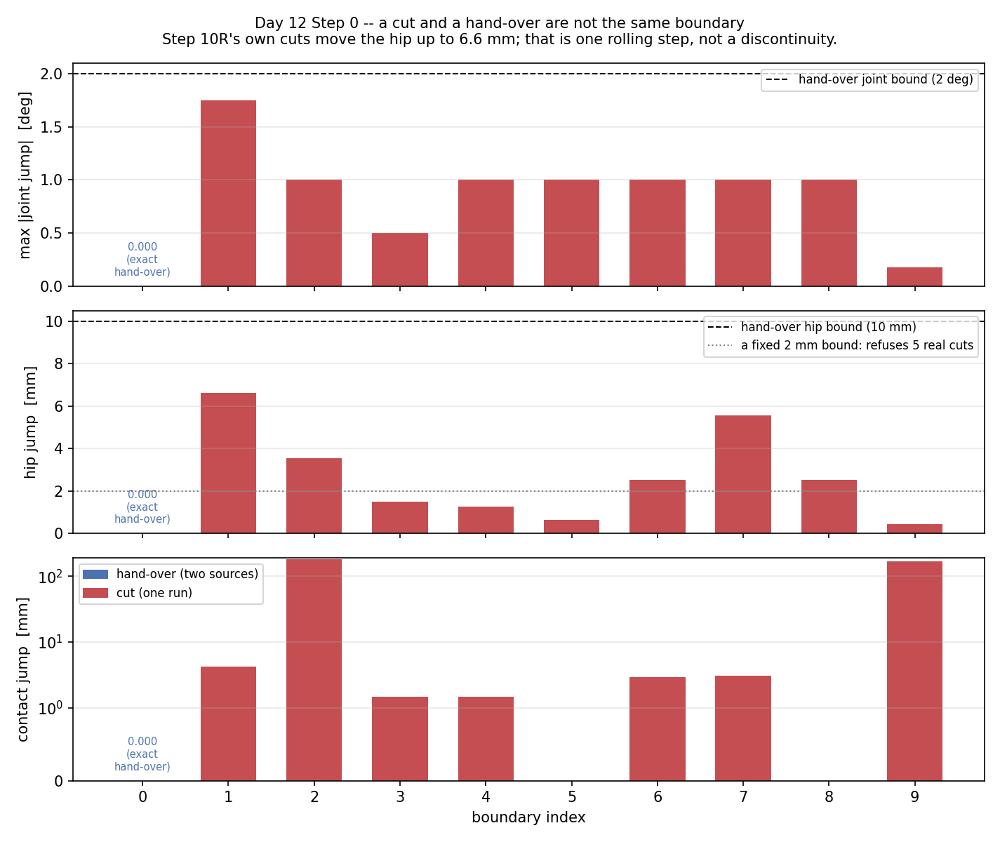

In [10]:
cuts = table[table.boundary_kind == "cut"]
print(f"boundaries        {len(table)}  "
      f"({(table.boundary_kind == 'handover').sum()} hand-over, {len(cuts)} cut)")
print(f"max cut hip jump  {cuts.hip_jump_mm.max():.3f} mm   "
      f"<- a fixed 2 mm bound would refuse "
      f"{(cuts.hip_jump_mm > 2.0).sum()} real cuts")
print(f"max cut |dbeta|   {cuts.beta_jump_deg.abs().max():.2f} deg")
print(f"max cut |dtheta|  {cuts.theta_jump_deg.abs().max():.2f} deg")
print(f"max contact jump  {table.contact_jump_mm.max():.1f} mm  "
      f"<- Day 10-11 trap 32: a change of chart at the +-180 deg seam, "
      f"not a motion")
print(f"all continuous    {table.continuous.all()}")

display(Image(filename=str(DAY12 / "day12_step0_boundary_evidence.png")))

### 這個區分抓得到什麼

同樣是 29 deg 的 beta 跳躍（Step 2b 量到的 `alpha = -40 deg` 接縫跳躍，
也就是推翻策略 #3 的那一個），在兩種 boundary 上是**兩個不同的失敗**：

- 出現在 handover：腿瞬移了 → `beta_jump`
- 出現在 cut：切點漏掉了 29 度的運動 → `beta_step_overrun`

兩個都是錯，但**要去修的地方完全不同**。報成同一個名字會讓 Day 12 找錯方向。

In [11]:
first = roll_segment(source="A", indices=(0, 1, 2))
jumped = replace(exit_state_2d(first),
                 beta_rad=float(exit_state_2d(first).beta_rad + np.deg2rad(29.0)))

for label, second in (
    ("handover (different source)",
     roll_segment(source="B", indices=(0, 1, 2), start=jumped)),
    ("cut      (same source)",
     roll_segment(source="A", indices=(3, 4, 5), start=jumped)),
):
    kind = boundary_kind_2d(first, second)
    _, breaks = chain_boundaries_2d((first, second))
    b = breaks[0]
    print(f"{label:30s} -> {kind.value:9s} "
          f"reason={b.reason:18s} value={np.rad2deg(b.value):5.2f} deg "
          f"limit={np.rad2deg(b.limit):.2f} deg")

handover (different source)    -> handover  reason=beta_jump          value=29.00 deg limit=2.00 deg
cut      (same source)         -> cut       reason=beta_step_overrun  value=29.00 deg limit=1.50 deg


### 接觸點跳很大**不是**不連續

Day 10–11 trap 32：跨過 `±180 deg` 的 rim 接縫，接觸點會移動 180 mm，
但關節只動了大約一度——那是**換座標卡，不是運動**。
所以 `max_contact_jump_m` 預設是 `None`：**永遠量、永遠報，但預設不判它**。
會失敗於接觸點跳躍的檢查器，第一個否決的就會是 Day 6–7 traversal 賴以成立的那個交接。

要判也可以，但必須是呼叫端明說的：

In [12]:
far = replace(exit_state_2d(first),
              point_world_xz_m=exit_state_2d(first).point_world_xz_m + np.array([0.162, 0.0]))
second = roll_segment(source="B", indices=(0, 1, 2), start=far)

_, default_breaks = chain_boundaries_2d((first, second))
_, strict_breaks = chain_boundaries_2d(
    (first, second), ChainTolerance2D(max_contact_jump_m=0.01))
print(f"contact jump                162.0 mm")
print(f"default tolerance  breaks : {[b.reason for b in default_breaks]}")
print(f"opt-in  tolerance  breaks : {[b.reason for b in strict_breaks]}")

contact jump                162.0 mm
default tolerance  breaks : []
opt-in  tolerance  breaks : ['contact_jump']


## 0.6 時間仍然是缺的，而且它是 Step 3 的建模決定

Day 6–7 的 traversal 是**準靜態**的，從來沒有被指定過時間
（implementation log trap 33：每一個 rolling segment 的 `duration_s` 都是 `None`）。
所以 `SegmentChain2D.total_duration_s` 回傳 `None` 而不是「把有時間的 swing 加一加」——
部分總和會誤導。哪些段需要 Step 3 補時間，明說出來：

In [13]:
print(f"total_duration_s   {chain.total_duration_s}")
print(f"untimed segments   {len(chain.untimed_segments)} / {len(chain.segments)}"
      f"   indices {chain.untimed_segments}")
print("\n-> Step 3 必須自己指定時間軸，而且那是一個【新的建模決定】，"
      "不是從既有資料讀得出來的。")

total_duration_s   None
untimed segments   11 / 11   indices (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10)

-> Step 3 必須自己指定時間軸，而且那是一個【新的建模決定】，不是從既有資料讀得出來的。


## 0.7 Step 0 驗收

規格 §7 的驗收條件：**可以明確回答 `FOOT_RIM_ROLL != WHEEL_ROLL`，
且 segment schema 不再把 Hybrid flat propagation 綁死在 theta = 17 deg。**

七項要求逐條：

| # | 要求 | 結果 |
|---|---|---|
| 1 | 判斷 `FOOT_RIM_ROLL` 能否表示而不破壞既有 segment | ✅ segment 層可以；**sequence 層不行**（0.4） |
| 2 | 必要時新增 `FOOT_RIM_ROLL` | ✅ 加了，並附兩個可機器檢查的 property |
| 3 | `WHEEL_ROLL` 保持獨立（theta ≈ 17 deg） | ✅ 且 17 deg 取自 `RobotParams.THETA0_DEG`，不是自己寫的數字 |
| 4 | 不重寫既有 rolling / swing 幾何 | ✅ 一行幾何都沒動 |
| 5 | 先不做四腳 timing | ✅ |
| 6 | segment start/end 用可串接的共同格式 | ✅ `entry_state_2d` / `exit_state_2d`，契約化 `PointContact2D` |
| 7 | regression tests | ✅ 25 個，全綠 |

跑一次 Day 10–11 ＋ Day 12 的完整回歸，確認**沒有動到任何既有結果**：

In [14]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest", "tests/test_day10_11_motion_schema_2d.py",
     "tests/test_day10_11_composer_2d.py", "tests/test_day10_11_body_timeline_2d.py",
     "tests/test_day12_segment_contract_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])

101 passed in 19.71s


## 0.8 Step 0 凍結了什麼 / Step 1 從哪裡開始

**凍結（Day 13–14 不應重寫）**

```text
SegmentKind.FOOT_RIM_ROLL           平地 nominal 的名字
  .pins_theta / .is_nominal_locomotion   兩者的區分，可 assert
WHEEL_MODE_THETA_RAD                取自 RobotParams.THETA0_DEG
entry_state_2d / exit_state_2d      可串接的共同端點格式
BoundaryKind.CUT / HANDOVER         兩種 boundary，兩種檢查
ChainTolerance2D                    每個預設值都有量測依據
SegmentChain2D                      多來源 chain；來源內 index 唯一仍然成立
```

**Step 1 要做的（`FOOT_RIM_ROLL` primitive）**

規格 §8 的重點是「**不要自己發明 theta**」：
nominal expanded posture 要從專案目前可執行的構型取得。
上面 0.3 顯示 Day 6–7 的 approach 站在 `theta = 60 deg`，
但那是 Day 6–7 sweep 為了爬 0.15 m 障礙挑的 `theta_climb`，
**不是**「平地 nominal 應該站多高」的答案。Step 1 第一件事就是把這個問題問清楚，
而不是把 60 deg 當成結論抄過去。

Step 1 還需要決定的：`FOOT_RIM_ROLL` 的 `duration_s` 要不要在這裡就給。
Step 0 的立場是**先不給**（Day 6–7 沒有時間，Step 3 才做時間軸），
但如果 Step 1 的產生器本來就以速度前進，那它是有時間的，
那時要明說「這是 Day 12 新指定的，不是 Day 6–7 量到的」。

---

# Step 1 — Nominal Flat-Ground Hybrid Cycle

規格 §8。平地 nominal locomotion 是一個循環，不是一條無限延伸的 segment：

```text
NOMINAL_HYBRID_CYCLE
    = FOOT_RIM_ROLL        有接觸的有限 rolling stroke
    + RECOVERY_SWING       liftoff → 縮腿 → 同向續轉 → 伸腿 → touchdown
```

規格要求「**實作前先確認 Day 8–9 的 swing generator 能不能表達 compact-recovery
的姿態變化**，並且優先擴充通用介面，不要另寫一個只給平地用的 swing generator」。

## 1.1 先回答那個問題：Day 8–9 的 swing generator **不能**表達它

兩個理由，都是結構性的，不是缺一個參數：

1. **在那裡 `theta` 是 IK 的輸出，不是輸入。**
   `generate_swing_2d` 先造 Cartesian 接觸點路徑，再逐 sample 解 IK；
   `SwingConstraints2D` 只有 `theta_min` / `theta_max` **邊界**，沒有 theta waypoint
   也沒有 theta profile。「縮到 `theta_compact` 再伸到 `theta_touchdown`」
   **沒有欄位可以放**。（Day 10–11 陷阱 16 是同一件事的另一面：落地 theta 是 IK 解出來的，
   所以你沒辦法指定它。）

2. **recovery 的定義性動作是 `beta` 轉將近一整圈。**
   要讓 foot rim 一邊前進一邊回到弧的起點，實測要轉 **280.31°**。
   Cartesian 路徑從 A 點到 B 點**決定不了圈數**，IK 會走近路。
   `SwingRequest2D` 連「轉向」都沒有欄位，更不用說「轉一圈」。

## 1.2 Day 6–7 已經有正確的動作，但被綁在障礙物上

`run_airborne_retract_and_foot_reset_branch_2d`：
`branch="forward_continuation"` 就是這個轉向，`theta_target_rad` 預設就是 17°，
`_airborne_beta_target_2d` 算的就是「下一個等價的 foot-down beta」。**語意完全對。**

但它 `terrain.obstacle is None` 就丟例外，要求起始幀是完成的 right-rim 頂面滾動，
落點過濾器只收 `obstacle_top` 這種 surface。**對的語意，接死在一種地形上。**

所以 Step 1 重用的是兩個 driver 共同的**基元**——
`build_single_leg_rolling_scene_2d`、`query_single_leg_rolling_scene_2d`、
`_translated_scene_with_sample_on_target_2d`、`_lowest_contact_sample`、
`_solve_flat_roll_rotation`、`_airborne_beta_target_2d`——**沒有新增任何幾何**。

滾動 stroke 尤其如此：它就是 Day 6–7 approach 走的同一個 no-slip 步，
只有停止條件不同，而連那個條件既有程式也已經在回報
（`_flat_roll_template` 在接觸要離開目前 rim 區域時回傳 `None`，
approach 把它叫作 `RIM_ARC_EXHAUSTED`）。

In [15]:
import time
from hybrid_note.scripts.experiments.day12_nominal_cycle_2d import (
    NominalPosture2D, RecoveryConfig2D, run_nominal_cycles_2d,
    run_foot_rim_roll_2d, recovery_beta_target_2d, cycle_segments_2d,
    cycle_summary_rows,
)

posture = NominalPosture2D()
recovery_config = RecoveryConfig2D()
print(f"nominal rolling posture   theta = {np.rad2deg(posture.theta_rad):.0f} deg"
      f"   -> flat stance hip_z = "
      f"{posture.hip_z_for_flat_stance(0.0)*1e3:.2f} mm")
print(f"compact recovery posture  theta_compact = "
      f"{np.rad2deg(recovery_config.theta_compact_rad):.0f} deg   "
      f"(a RecoveryConfig2D field, not a constant in the planner)")
print(f"registered obstacle       {posture.scene_kwargs['obstacle_x_start_m']}"
      f"   <- there is no terrain feature to leak into the nominal cycle")

started = time.time()
cycles = run_nominal_cycles_2d(2)
print(f"\ngenerated {len(cycles)} cycles in {time.time()-started:.1f} s")
summary = pd.DataFrame(cycle_summary_rows(cycles))
display(summary.T)

nominal rolling posture   theta = 60 deg   -> flat stance hip_z = 219.45 mm
compact recovery posture  theta_compact = 17 deg   (a RecoveryConfig2D field, not a constant in the planner)
registered obstacle       None   <- there is no terrain feature to leak into the nominal cycle

generated 2 cycles in 53.7 s


,0,1
cycle,0,1
success,True,True
stroke_stop_reason,RIM_ARC_EXHAUSTED,RIM_ARC_EXHAUSTED
recovery_failure_reason,None,None
stroke_frames,49,49
recovery_frames,119,119
alpha_from_deg,-40.0,-40.0
alpha_to_deg,40.0,40.0
stroke_contact_advance_mm,202.457908,202.457908
stroke_hip_advance_mm,297.064939,297.064939


## 1.3 nominal posture 的來源：**沒有**一個現成常數，所以它是參數

規格說「theta 要從專案既有的 nominal configuration 取得，不要憑空指定」。查下來的結果是：

- `TrajectoryParams.STAND_HEIGHT = 0.30`，但 `gait_generator` 用 `0.25`、
  `gait_generator_3d` 用 `0.31`——**三個 planner 三個值**；
- 而且換算慣例還不同：`trajectory_planning` 減 `foot_radius`，
  `gait_generator_3d` 加 `ABAD_AXIS_OFFSET`，這個 2D 模型兩個都沒有。

挑其中一個叫作「the」nominal posture，等於**虛構一個並不存在的共識**。

真正在**這條 2D pipeline** 裡被一致使用的是 `theta = 60 deg`：
Day 6–7 的 approach 站在它，Day 8–9 的 `REGRESSION_THETA_RAD` 也是它。
所以 `NominalPosture2D.theta_rad` 預設 60°（**引用**，不是選擇），
對應的站高 219.4 mm 是**算出來的**（`hip_z_for_flat_stance`），不是寫死的。

## 1.4 stroke 的起點：一個看起來對、但錯了 28.5 mm 的答案

`FOOT_RIM_ROLL` 應該從 foot 弧的**後端**開始。中間量錯了兩次，兩次都值得記下來。

**錯法一：往回滾。** `_flat_roll_template` 要求新的支撐 sample **大於**舊的，
所以它只會往前走，往回呼叫第一步就回傳 `None`。第一版就是這樣，
於是「弧的起點」被無聲地報成 `beta = 0`——**弧的中點**——每個 stroke 都少了一半。

**錯法二：找 foot 區域的盡頭。** 再往回轉並不會繼續滾：
過了 `beta ≈ 40°` 之後支撐 sample **不動了**，釘在 foot rim 的第 0 個 sample，
也就是 **foot/left 接縫的角**，腿繞著它轉。那是 **corner pivot**
（Day 10–11 的 `RollingMode.CORNER_PIVOT`，陷阱 31），而且還會再持續 20°
到 `beta ≈ 60°` 才換 left rim 接手。

從那裡起跑，**滾動距離一點都沒有多**，卻多付 28.5 mm 的 hip 下沉。下表是證據：

In [16]:
evidence = pd.read_csv(DAY12 / "day12_step1_arc_start_evidence.csv")
display(evidence)

pivot = evidence[(evidence.on_foot_rim) & (evidence.alpha_deg <= -39.99)]
print(f"alpha pinned at -40 deg for beta {pivot.beta_deg.min():.0f} -> "
      f"{pivot.beta_deg.max():.0f} deg   (support sample frozen at "
      f"{int(pivot.support_sample.iloc[0])})")
print(f"hip_z falls {pivot.hip_z_mm.max()-pivot.hip_z_mm.min():.1f} mm across that "
      f"pivot, for zero rolling distance")

,beta_deg,support_sample,contact_region,alpha_deg,hip_z_mm,on_foot_rim
0,30.0,30,foot_rim,-30.000000,209.474393,True
1,32.0,24,foot_rim,-32.000000,208.136007,True
2,34.0,18,foot_rim,-34.000000,206.720700,True
3,36.0,12,foot_rim,-36.000000,205.230195,True
4,38.0,6,foot_rim,-38.000000,203.666310,True
5,40.0,0,foot_rim,-40.000000,202.030949,True
6,42.0,0,foot_rim,-40.000000,200.237774,True
7,44.0,0,foot_rim,-40.000000,198.200640,True
8,46.0,0,foot_rim,-40.000000,195.922029,True
9,48.0,0,foot_rim,-40.000000,193.404718,True


alpha pinned at -40 deg for beta 40 -> 60 deg   (support sample frozen at 0)
hip_z falls 28.6 mm across that pivot, for zero rolling distance


所以 stroke 的起點定義成「**滾動**開始的地方」：
接觸第一次抵達 foot rim 自己的 alpha 下界的那個最小 beta，
而那個下界是從 `rim_alpha_limits_rad(RimId.FOOT)` 讀的，不是寫在 Day 12 裡的。
過了它是 pivot，在它之前是 roll。

## 1.5 一個 cycle 剛好是 leg-wheel 轉一整圈

這不是巧合，而是「讓接觸回到弧上同一個位置」的**定義**。
也因此 `recovery_beta_target_2d` 是一個減法，不是一次搜尋。

In [17]:
row = summary.iloc[0]
print(f"rolling   {row.stroke_rotation_deg:7.2f} deg   "
      f"alpha {row.alpha_from_deg:+.0f} -> {row.alpha_to_deg:+.0f} deg, "
      f"contact +{row.stroke_contact_advance_mm:.1f} mm")
print(f"airborne  {row.recovery_rotation_deg:7.2f} deg   "
      f"theta down to {row.recovery_theta_min_deg:.0f} deg, clearance "
      f"{row.recovery_rotation_min_clearance_mm:.1f} mm")
print(f"          {'-'*7}")
print(f"cycle     {row.cycle_rotation_deg:7.2f} deg   = one revolution")
print(f"\nhip advance per cycle      {row.cycle_hip_advance_mm:.1f} mm")
print(f"hip z travel during stance {row.stroke_hip_z_travel_mm:.2f} mm"
      f"   <- the nominal cycle's own body requirement")

# The two cycles must be identical, or "cycle" is the wrong word for it.
a, b = cycle_summary_rows(cycles)
same = all(np.isclose(a[k], b[k]) for k in
           ("stroke_contact_advance_mm", "cycle_hip_advance_mm",
            "stroke_rotation_deg", "recovery_rotation_deg"))
print(f"\ncycle 1 is cycle 0 translated forward: {same}")

rolling     79.69 deg   alpha -40 -> +40 deg, contact +202.5 mm
airborne   280.31 deg   theta down to 17 deg, clearance 57.2 mm
          -------
cycle      360.00 deg   = one revolution

hip advance per cycle      297.1 mm
hip z travel during stance 17.29 mm   <- the nominal cycle's own body requirement

cycle 1 is cycle 0 translated forward: True


## 1.6 相位圖與動畫（規格 §8.5(8)）

四件事在圖上直接可讀：

- `theta` 在 60° 與 17° 之間往返，兩條虛線分別是 nominal posture 與 `theta_compact`；
- **`beta` 全程單調下降**——接觸中與空中是同一個前進轉向，這就是 §0.2 的
  rotation-direction 原則；
- `alpha` 在 stance 期間從 −40° 掃到 +40°，空檔就是 airborne；
- clearance 在 stance 為 0、rotate 期間約 57 mm。

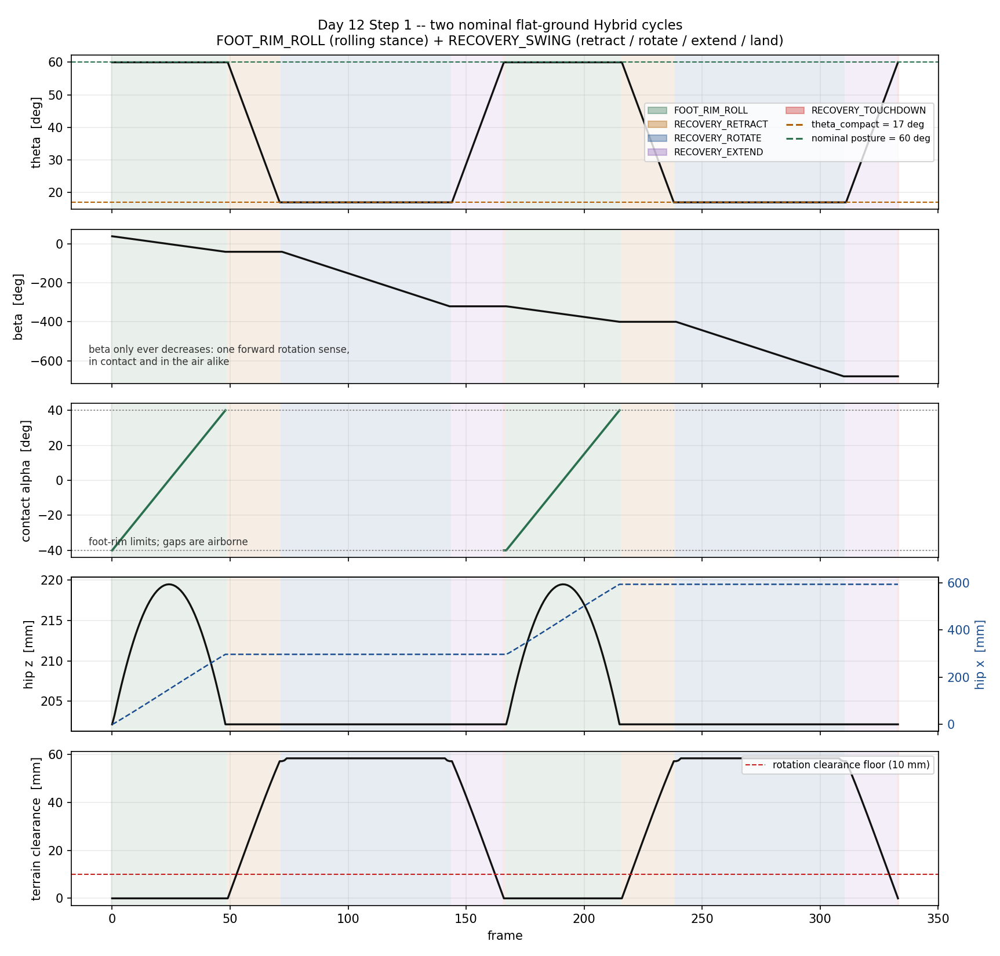

In [18]:
display(Image(filename=str(DAY12 / "day12_step1_phase_plot.png")))

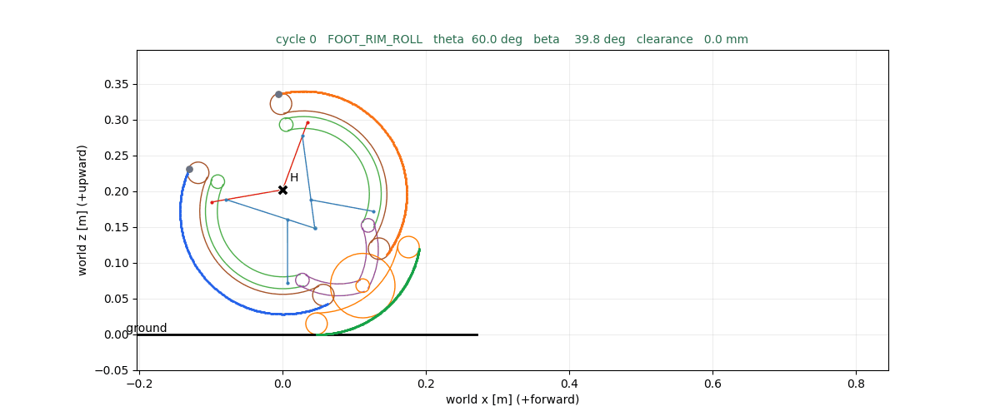

In [19]:
display(Image(filename=str(DAY12 / "day12_step1_cycle_animation.gif")))

### clearance 的門檻只能套在 rotate，不能套在整段 airborne

第一版對**每一個** airborne frame 都要求 `min_clearance_m`，然後在自己的第一個 cycle
就失敗了：liftoff 與 touchdown 兩側的 frame，clearance **依定義為 0**——它們就是
離地與觸地的那一刻。門檻屬於「腿橫掃過地面」的那一段，也就是 rotation；
兩段 ramp 要求的只是**不要穿過去**。

**這和 Step 0 踩到的是同一類錯**：一個為某種情況設計的量，套到不適用的情況上。

另外一個原本以為需要、實際上不需要的東西：**整圈 cycle 的 recovery 完全不用抬 hip**。
foot 弧對 `alpha = 0` 對稱，所以弧的兩端 hip 高度**相同**（都是 202.161 mm），
ramp 剛好是 0.0000 mm。但它不是廢碼——被 `max_distance_m` 截短的 stroke
（接近 transition 的腿就是這樣）會停在拱形半路，得**降**回落地高度，實測 −12.7 mm。

In [20]:
for label, stroke in (
    ("full stroke ", run_foot_rim_roll_2d(posture)),
    ("50 mm stroke", run_foot_rim_roll_2d(posture, max_distance_m=0.05)),
):
    touchdown_z = posture.hip_z_for_flat_stance(recovery_beta_target_2d(stroke))
    ramp = (touchdown_z - stroke.end.hip_xz_m[1]) * 1e3
    print(f"{label}  stop={stroke.stop_reason:26s} "
          f"hip_z end {stroke.end.hip_xz_m[1]*1e3:7.3f} mm -> "
          f"touchdown {touchdown_z*1e3:7.3f} mm   ramp {ramp:+7.4f} mm")

full stroke   stop=RIM_ARC_EXHAUSTED          hip_z end 202.161 mm -> touchdown 202.161 mm   ramp +0.0000 mm
50 mm stroke  stop=REQUESTED_DISTANCE_REACHED hip_z end 214.889 mm -> touchdown 202.161 mm   ramp -12.7279 mm


## 1.7 接進 Step 0 的 chain 契約

一個 cycle 變成兩個 segment，而且直接餵得進 `SegmentChain2D`。
兩者的 body requirement 是**不同種類**的，這不是風格問題：

- stance 的 hip 高度是接觸幾何的**輸出**，所以是 `TRACK`；
- airborne 時 body 不被要求追隨任何東西，只要夠高讓腿過得去，所以是 `LOWER_BOUND`。

`duration_s` 兩邊都是 `None`：這個產生器以 beta 前進、不以時間前進
（Day 10–11 陷阱 33）。時間軸是 Step 3 的建模決定，不該在這裡先編一個。

In [21]:
from hybrid_note.scripts.experiments.day12_segment_contract_2d import (
    SegmentChain2D, boundary_rows_2d,
)

segments, offset = [], 0
for cycle in cycles:
    pair = cycle_segments_2d(cycle, source_id="day12_step1", frame_offset=offset)
    segments.extend(pair)
    offset += sum(s.frames.frame_count for s in pair)

chain = SegmentChain2D(leg_id="single_leg_2d", segments=tuple(segments))
print(f"kinds        {[s.kind.value for s in chain.segments]}")
print(f"is_chained   {chain.is_chained}")
print(f"is_complete  {chain.is_complete}")
print(f"untimed      {len(chain.untimed_segments)} / {len(chain.segments)}"
      f"   (Step 3 supplies the timeline)")

rows = pd.DataFrame([
    {"kind": s.kind.value, "nominal": s.kind.is_nominal_locomotion,
     "terrain_transition": s.kind.is_terrain_transition,
     "swing": s.kind.is_swing,
     "body_kind": s.body_requirement.kind.value,
     "frames": s.frames.frame_count, "duration_s": s.duration_s}
    for s in chain.segments
])
display(rows)
display(pd.DataFrame(boundary_rows_2d(chain.segments, chain.tolerance))[
    ["boundary_index", "boundary_kind", "from", "to",
     "theta_jump_deg", "beta_jump_deg", "hip_jump_mm", "continuous"]].round(3))

kinds        ['FOOT_RIM_ROLL', 'RECOVERY_SWING', 'FOOT_RIM_ROLL', 'RECOVERY_SWING']
is_chained   True
is_complete  True
untimed      4 / 4   (Step 3 supplies the timeline)


,kind,nominal,terrain_transition,swing,body_kind,frames,duration_s
0,FOOT_RIM_ROLL,True,False,False,track,49,None
1,RECOVERY_SWING,True,False,True,lower_bound,119,None
2,FOOT_RIM_ROLL,True,False,False,track,49,None
3,RECOVERY_SWING,True,False,True,lower_bound,119,None


,boundary_index,boundary_kind,from,to,theta_jump_deg,beta_jump_deg,hip_jump_mm,continuous
0,0,cut,FOOT_RIM_ROLL/NOMINAL_FOOT_RIM_ROLL,RECOVERY_SWING/NOMINAL_RECOVERY_SWING,0.0,0.0,0.0,True
1,1,cut,RECOVERY_SWING/NOMINAL_RECOVERY_SWING,FOOT_RIM_ROLL/NOMINAL_FOOT_RIM_ROLL,0.0,0.0,0.0,True
2,2,cut,FOOT_RIM_ROLL/NOMINAL_FOOT_RIM_ROLL,RECOVERY_SWING/NOMINAL_RECOVERY_SWING,0.0,0.0,0.0,True


## 1.8 Step 1 驗收

規格 §8 的驗收條件：

| 條件 | 結果 |
|---|---|
| flat ground 上連續產生 `ROLL → RECOVERY → ROLL → RECOVERY` | ✅ 兩個 cycle，且完全相同 |
| contact-phase rolling direction is consistent | ✅ `beta` 全程單調下降 |
| `theta_compact` is configurable | ✅ `RecoveryConfig2D.theta_compact_rad` |
| next touchdown leg length is terrain/state dependent | ✅ `theta_touchdown` = 60° ≠ `theta_compact` = 17° |
| no terrain collision during recovery | ✅ rotate 期間最小 57.2 mm |
| net body displacement > 0 | ✅ 297.1 mm / cycle |

§8.5 的九項實作要求也逐條成立（1 reuse rolling、2 reuse 基元而非另寫 generator、
3 無 obstacle-height 專屬邏輯、4 17° 只住在 `RecoveryConfig2D`、5 兩個 cycle、
6 八項驗證、7 chainable segment、8 動畫與相位圖、9 不含 obstacle / ROLL-SWING 決策）。

In [22]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day10_11_motion_schema_2d.py",
     "tests/test_day10_11_composer_2d.py",
     "tests/test_day10_11_body_timeline_2d.py",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])

132 passed in 102.77s (0:01:42)


## 1.9 Step 1 留給後面的東西

```text
凍結
  NominalPosture2D        nominal 姿態與取樣，theta 是參數
  RecoveryConfig2D        theta_compact / 步長 / clearance，17 度只住這裡
  RollStroke2D            有限 stroke，停止條件 RIM_ARC_EXHAUSTED
  RecoverySwing2D         retract / rotate / extend / touchdown 四相位
  NominalCycle2D          一個 cycle = leg-wheel 一整圈
  cycle_segments_2d()     -> 兩個 chainable MotionSegment2D

Step 2 之後才決定的
  時間軸          Step 3。這裡的 duration_s 全是 None，不是 0
  body 在 recovery 期間走多遠   RecoveryConfig2D.hip_advance_m 目前是 0，
                              因為 body trajectory 是 Step 5 的事
  gamma           Day 12 固定 0，但已經在 scene 裡
```

**Step 2 要做的**：四腳 world-frame 初始化與地形註冊（規格 §9）。
注意 §0.1 的 generalization freeze——地形是 `height / top_length / x_start` 參數，
`4 cm / 10 cm / 19 cm` 只是 evaluation query，不能寫成 planner 內部的 branch。

---

# Step 2 — Four-Leg Initial State 與 Terrain Registration

規格 §9。把單腳 2D 的結果**掛上**真實四腳幾何。這一步**不做** timing、
不做 support polygon、不做 body planning——只放四隻腳與一個參數化平台，
問既有的 contact query 每隻腳踩在什麼上面，然後檢查左右對稱。

## 2.1 沒有任何一個機器人尺寸是新編的

mounting 是把 sagittal leg frame 的原點（`p_L = 0`）用**專案自己的**
`{Li} → {Mi} → {B}` 轉換矩陣推到 body frame 得到的，
而不是自己從 `WHEEL_BASE` / `BODY_WIDTH` 重推一次。

**這一點很重要，因為橫向那一項很容易寫錯**：
sagittal 平面在**輪子中平面**，不在 ABAD 軸上，
所以是 `BODY_WIDTH/2 + WHEEL_AXIAL_OFFSET = 211.675 mm`，**不是** `BODY_WIDTH/2 = 120 mm`。
垂直那一項是 `ABAD_AXIS_OFFSET = 57.166 mm`——腿平面吊在 body 原點**上方**。

`LegId` 的命名用規格的 LF/RF/LH/RH，但**索引沿用專案既有的**
（`CorgiLegKinematics`：`0: FL, 1: FR, 2: RR, 3: RL`），
所以 LF 就是 FL、RH 就是 RR。**改名不改號**，否則
`joint_position_rad` 的每一列都會換一隻腳。

In [23]:
from hybrid_note.scripts.experiments.day10_11_shared_scene_2d import SharedTerrainSpec2D
from hybrid_note.scripts.experiments.day12_four_leg_state_2d import (
    LEG_ORDER, LegId, FlatRunExtent2D, leg_mounts_2d, sagittal_reach_agreement_2d,
    initialize_four_leg_state_2d, four_leg_rows, plot_four_leg_state_2d,
)
from legwheel.config import RobotParams

display(pd.DataFrame([m.as_dict() for m in leg_mounts_2d()]))
print(f"BODY_WIDTH/2                        = "
      f"{RobotParams.BODY_WIDTH/2*1e3:.3f} mm")
print(f"BODY_WIDTH/2 + WHEEL_AXIAL_OFFSET   = "
      f"{(RobotParams.BODY_WIDTH/2 + RobotParams.WHEEL_AXIAL_OFFSET)*1e3:.3f} mm"
      f"   <- 這個才是 sagittal 平面的位置")

,leg,leg_index,is_left,is_front,offset_x_mm,offset_y_mm,offset_z_mm
0,LF,0,True,True,255.0,211.675,57.166
1,RF,1,False,True,255.0,-211.675,57.166
2,LH,3,True,False,-255.0,211.675,57.166
3,RH,2,False,False,-255.0,-211.675,57.166


BODY_WIDTH/2                        = 120.000 mm
BODY_WIDTH/2 + WHEEL_AXIAL_OFFSET   = 211.675 mm   <- 這個才是 sagittal 平面的位置


## 2.2 2D 與 3D 是不是在講同一隻腳？量一次，不要用假設

整條 Day 6–11 pipeline 是**矢狀面 2D**，它的「hip」被宣稱等於 3D 模型的
leg-plane 原點。這是掛載能不能成立的**前提**，所以要量而不是假設：

- `CorgiLegKinematics.forward_kinematics`：θ=60° 時腳在 leg-plane 原點**下方** 219.4486 mm；
- Step 1 的 `NominalPosture2D.hip_z_for_flat_stance`：hip 在平地**上方** 219.4486 mm。

兩條完全不同的程式路徑，差 `1e-6 mm`——而那個殘差**正好就是** 2D scene 自己刻意加的
`surface_offset_m = 1e-9 m`，不是模型分歧。

In [24]:
for k, v in sagittal_reach_agreement_2d().items():
    print(f"  {k:28s} {v}")

  theta_deg                    59.99999999999999
  beta_deg                     0.0
  hip_to_foot_drop_3d_mm       219.4486146594895
  hip_stance_height_2d_mm      219.4486156594895
  difference_mm                -9.999999994736442e-07


## 2.3 地形是**參數**，不是 branch

規格 §0.1 的 generalization freeze。平台直接用 Day 10–11 已經在用的
參數化矩形 `SharedTerrainSpec2D`（`height_m` / `top_length_m` / `x_start_m` /
`ground_height_m`），**沒有新增地形型別**，模組裡也沒有出現任何實驗尺寸。

`flat_before` / `flat_after` 另外用 `FlatRunExtent2D` 帶——
因為 `TerrainProfile2D` 的地面是**無界**的，它們不是幾何邊界，
而是「nominal cycle 打算在哪裡跑」這個**計畫輸入**。分開放，才不會被讀成地形邊緣。

In [25]:
terrain = SharedTerrainSpec2D(height_m=0.04, top_length_m=0.40, x_start_m=1.00,
                              obstacle_id="day12_platform")
extent = FlatRunExtent2D()
state = initialize_four_leg_state_2d(terrain, extent=extent)

print(f"body  {np.round(state.body_position_world_m*1e3, 3)} mm   "
      f"rpy {np.round(state.body_rpy_rad, 12)}")
print(f"all_in_contact {state.all_in_contact}   is_symmetric {state.is_symmetric}")
display(pd.DataFrame(state.rows())[
    ["leg", "leg_index", "hip_x_mm", "hip_y_mm", "hip_z_mm", "in_contact",
     "surface_id", "rim", "alpha_deg", "surface_gap_mm", "collision"]].round(4))

body  [145.      0.    162.283] mm   rpy [0. 0. 0.]
all_in_contact True   is_symmetric True


,leg,leg_index,hip_x_mm,hip_y_mm,hip_z_mm,in_contact,surface_id,rim,alpha_deg,surface_gap_mm,collision
0,LF,0,400.0,211.675,219.4486,True,ground,foot_rim,0.0,0.0,False
1,RF,1,400.0,-211.675,219.4486,True,ground,foot_rim,0.0,0.0,False
2,LH,3,-110.0,211.675,219.4486,True,ground,foot_rim,0.0,0.0,False
3,RH,2,-110.0,-211.675,219.4486,True,ground,foot_rim,0.0,0.0,False


In [26]:
sweep = pd.read_csv(DAY12 / "day12_step2_terrain_sweep.csv")
display(sweep)
print(f"body_z 取值個數 = {sweep.body_z_mm.round(6).nunique()}  "
      f"（初始站姿在下層地面，本來就【不應該】隨平台高度改變）")

,platform_height_mm,platform_top_length_mm,platform_x_start_mm,platform_x_end_mm,body_x_mm,body_z_mm,all_in_contact,is_symmetric
0,1.0,400.0,1000.0,1400.0,145.0,162.282616,True,True
1,40.0,400.0,1000.0,1400.0,145.0,162.282616,True,True
2,100.0,400.0,1000.0,1400.0,145.0,162.282616,True,True
3,190.0,400.0,1000.0,1400.0,145.0,162.282616,True,True
4,70.0,220.0,1000.0,1220.0,145.0,162.282616,True,True


body_z 取值個數 = 1  （初始站姿在下層地面，本來就【不應該】隨平台高度改變）


## 2.4 左右對稱檢查：`y` 要比「相反」，不是比「相等」

這是這一步最該抓到的錯。左腳與它的鏡像面對**相同的縱向地形**，
所以每一個量都要相等——**除了 `y`，它必須大小相等、正負相反**。
如果 `y` 也拿去比相等，那「兩隻腳都在同一側」的機器人會**通過**檢查。

所以 `SymmetryCheck2D` 把比較的量明寫出來，`hip_y_m (mirrored)` 比的是**和為零**。

In [27]:
checks = pd.DataFrame([c.as_dict() for c in state.symmetry_checks()])
display(checks)
print(f"failed = {(~checks.symmetric).sum()} / {len(checks)}")

,quantity,left_leg,right_leg,left_value,right_value,difference,tolerance,symmetric,note
0,hip_x_m,LF,RF,4.000000e-01,4.000000e-01,0.0,1.000000e-09,True,
1,hip_z_m,LF,RF,2.194486e-01,2.194486e-01,0.0,1.000000e-09,True,
2,hip_y_m (mirrored),LF,RF,2.116750e-01,-2.116750e-01,0.0,1.000000e-09,True,"left and right y must sum to zero, not be equal"
3,in_contact,LF,RF,1.000000e+00,1.000000e+00,0.0,0.000000e+00,True,
4,surface_id,LF,RF,NaN,NaN,NaN,0.000000e+00,True,ground vs ground
5,surface_gap_m,LF,RF,1.000000e-09,1.000000e-09,0.0,1.000000e-09,True,
6,contact_x_m,LF,RF,4.000000e-01,4.000000e-01,0.0,1.000000e-09,True,
7,hip_x_m,LH,RH,-1.100000e-01,-1.100000e-01,0.0,1.000000e-09,True,
8,hip_z_m,LH,RH,2.194486e-01,2.194486e-01,0.0,1.000000e-09,True,
9,hip_y_m (mirrored),LH,RH,2.116750e-01,-2.116750e-01,0.0,1.000000e-09,True,"left and right y must sum to zero, not be equal"


failed = 0 / 14


## 2.5 一個**不合法**的站姿要被報出來，不是被偷偷修好

body 水平、站在下層地面高度時，如果某隻腳的 hip 已經越過平台前緣，
那隻腳**構不到**平台面——實際上是**插進去** 40 mm（`gap` 是負的、`collision=True`）。

Step 2 的正確輸出是「這不是一個合法的四腳站姿，這是原因」。
把 body 抬起來修它是 **Step 5** 的工作；在這裡偷偷放低一隻腳，
等於生出一個沒有人規劃過的站姿。

注意它**仍然是左右對稱的**——這正是把 symmetry check 與 contact validity
分開的理由：兩個問題不同。

In [28]:
straddling = initialize_four_leg_state_2d(terrain, extent=extent, body_x_m=0.90)
print(f"all_in_contact {straddling.all_in_contact}   "
      f"is_symmetric {straddling.is_symmetric}")
display(pd.DataFrame(straddling.rows())[
    ["leg", "hip_x_mm", "in_contact", "surface_id", "surface_gap_mm",
     "collision"]].round(3))
print(f"平台高度 {terrain.height_m*1e3:.0f} mm  ->  前腳 gap = "
      f"{straddling.leg(LegId.LF).surface_gap_m*1e3:+.1f} mm（穿透，不是懸空）")

all_in_contact False   is_symmetric True


,leg,hip_x_mm,in_contact,surface_id,surface_gap_mm,collision
0,LF,1155.0,False,None,-40.0,True
1,RF,1155.0,False,None,-40.0,True
2,LH,645.0,True,ground,0.0,False
3,RH,645.0,True,ground,0.0,False


平台高度 40 mm  ->  前腳 gap = -40.0 mm（穿透，不是懸空）


## 2.6 視覺化：兩個視角，因為一個抓不到 mapping 錯誤

- **矢狀視圖**：平台、站高、四個 hip 與四個接觸點；
- **俯視圖**：LF/LH 在 `+y`、RF/RH 在 `−y`、前腳對在 `+x`——
  索引排列錯了會直接看到一台鏡像的機器人。

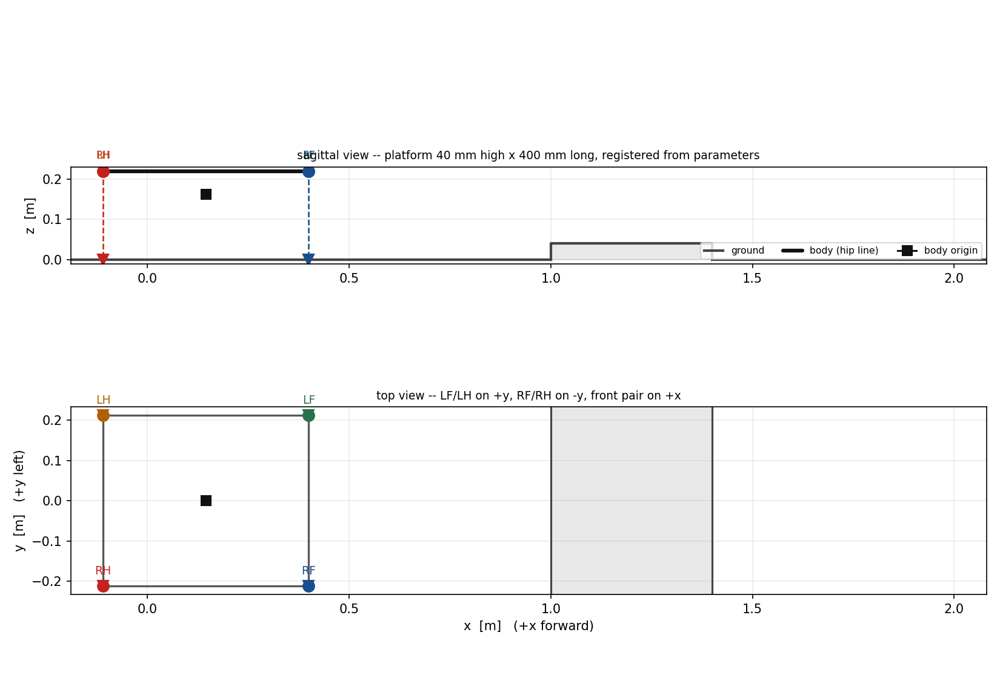

In [29]:
display(Image(filename=str(DAY12 / "day12_step2_four_leg_state.png")))

## 2.7 Step 2 驗收（規格 §9 的九項）

| # | 要求 | 結果 |
|---|---|---|
| 1 | LF/RF/LH/RH hip/module offset | ✅ 由 `CorgiLegKinematics` 轉換得到，未自訂常數 |
| 2 | 使用專案既有 world-frame 慣例 | ✅ `+x` 前、`+y` 左、`+z` 上；輸出 `InitialRobotState` |
| 3 | gamma = 0 | ✅ 且 `leg_mounts_2d(gamma≠0)` 直接拒絕 |
| 4 | body roll/pitch/yaw = 0 | ✅ 非水平 body 會被 `FourLegState2D` 擋下 |
| 5 | 註冊一個參數化對稱平台 | ✅ `SharedTerrainSpec2D`，模組內無任何實驗尺寸 |
| 6 | 每隻腳的 hip pose / contact point / surface id / θβγ | ✅ `LegState2D` |
| 7 | 先不做 gait timing | ✅ |
| 8 | 一張圖：body、四 hip、四接觸點、平台 | ✅ 兩個視角 |
| 9 | 左右對稱 sanity check | ✅ 14 項，`y` 比鏡像 |

**Step 2 交給 Step 3 的東西**

```text
FourLegState2D
  .body_position_world_m / .body_rpy_rad
  .legs -> LegState2D（hip world / contact world / surface / rim / alpha / θβγ）
  .joint_position_rad          (4,3)，用【專案的】腿索引排列
  .as_initial_robot_state()    Day 1 的型別化交接
  .symmetry_checks() / .is_symmetric
  .all_in_contact              -> Step 3 排程前要知道這個狀態合不合法
LEG_ORDER / LegId              LF RF LH RH，索引仍是 0 1 3 2
leg_mounts_2d()                四個 mounting offset
FlatRunExtent2D                flat_before / flat_after，計畫輸入
```

**Step 3 會用到、Step 2 已經量好的**：前後 hip 相距 `WHEEL_BASE = 510 mm`，
Step 1 的一個 cycle 前進 297.06 mm——所以前後腳抵達平台前緣的**時間差**
是既有數字，不需要重新決定。

---

# Step 3 — Four-Leg Timing Skeleton

規格 §10。到 Step 2 為止，**所有** segment 的 `duration_s` 都是 `None`：
Day 6–11 是 quasi-static 的，沒有時間。Step 3 是時間**第一次**出現的地方，
而它是一個**建模決定**，不是量出來的物理量——所以每個
`ScheduledSegment2D` 都帶著 `duration_is_assigned = True`，
不讓下游把它誤讀成觀測值。

Step 3 **不做**：support polygon、CoM margin、body trajectory、
以及「衝突發生時自動改排程」。衝突要**報**，不要修。

## 3.1 步態參數不是新編的，是讀既有的

`GAIT_LIBRARY["Walk"]`：`stance_duty = 0.75`、
`phase_offsets = [0.75, 0.25, 0.5, 0.0]`（**依專案的腿索引**排）。
duty 0.75 的意思就是每隻腳有 1/4 個週期在空中——四隻腳剛好把一圈鋪滿，
不重疊也不留縫。這一點不能只相信註解，要驗：

In [30]:
from hybrid_note.scripts.experiments.day12_timing_skeleton_2d import (
    LegMode, GaitTiming2D, walk_timing_2d, rotation_rate_demand_2d,
    schedule_chains_2d, schedule_rows, plot_timeline_2d,
)
from hybrid_note.scripts.experiments.day12_segment_contract_2d import SegmentChain2D
from hybrid_note.scripts.experiments.day12_nominal_cycle_2d import (
    run_nominal_cycles_2d, cycle_segments_2d,
)

timing = walk_timing_2d()
print(f"gait          {timing.gait_name}   (GAIT_LIBRARY, 不是這裡定義的)")
print(f"stance duty   {timing.stance_duty}"
      f"  -> stance {timing.stance_duration_s:.3f} s / "
      f"swing {timing.swing_duration_s:.3f} s  於 T = {timing.cycle_period_s} s")
print(f"duty 本身允許同時 {timing.max_simultaneous_airborne} 隻腳在空中\n")

windows = sorted(((timing.swing_window(l), l) for l in LEG_ORDER))
for (lo, hi), leg in windows:
    print(f"  {leg.value}  swing [{lo:.2f}, {hi:.2f})")
edges = [w for (w, _) in windows]
tiles = all(abs(edges[i][1] - edges[i+1][0]) < 1e-12 for i in range(3)) \
        and abs(edges[0][0]) < 1e-12 and abs(edges[-1][1] - 1.0) < 1e-12
print(f"\n四個窗口剛好鋪滿一圈（無重疊、無空隙）: {tiles}")
print(f"swing 順序: {' -> '.join(l.value for (_, l) in windows)}")

gait          Walk   (GAIT_LIBRARY, 不是這裡定義的)
stance duty   0.75  -> stance 1.800 s / swing 0.600 s  於 T = 2.4 s
duty 本身允許同時 1 隻腳在空中

  LF  swing [0.00, 0.25)
  RH  swing [0.25, 0.50)
  RF  swing [0.50, 0.75)
  LH  swing [0.75, 1.00)

四個窗口剛好鋪滿一圈（無重疊、無空隙）: True
swing 順序: LF -> RH -> RF -> LH


## 3.2 duty 不是選的，是被逼的——而代價寫在 β 的角速度上

Step 1 量到一個 nominal cycle 是 `79.69° 滾 + 280.31° 空中`。
如果**讓時間正比於轉角**（最省力的排法），空中佔的時間比例就是
280.31/360 = 0.779，於是 `duty = 0.221`——平均會有
`4 x (1 - 0.221) ≈ 3.1` 隻腳同時在空中。四腳準靜態要求同時**最多一隻**，
也就是 `duty >= 0.75`。

所以 duty 0.75 不是一個偏好，是四腳約束的**後果**。而把 0.75 代回去，
就得到 Step 3 唯一的實質量測：**recovery 必須把 β 掃得比 rolling 快 10.6 倍**。

這個比值**與週期無關**——下面同時用 T = 0.8 / 2.4 / 9.0 s 檢查。
Step 3 只**記錄**這個數字，**不判斷**它有沒有超過關節速度極限：那是 Step 9 的事。

In [31]:
generated = run_nominal_cycles_2d(2)
first = generated[0]

demand = pd.DataFrame([
    {"cycle_period_s": T,
     **rotation_rate_demand_2d(first.stroke.rotation_rad,
                               first.recovery.rotation_rad, walk_timing_2d(T))}
    for T in (0.8, 2.4, 9.0)
])
display(demand[["cycle_period_s", "stance_duty", "rotation_proportional_duty",
                "stance_rate_deg_per_s", "swing_rate_deg_per_s",
                "swing_to_stance_rate_ratio"]])
ratios = set(demand["swing_to_stance_rate_ratio"].round(9))
print(f"ratio 在三個週期下相同: {len(ratios) == 1}"
      f"   -> Step 3 被迫挑的那個 T 不影響結論")

,cycle_period_s,stance_duty,rotation_proportional_duty,stance_rate_deg_per_s,swing_rate_deg_per_s,swing_to_stance_rate_ratio
0,0.8,0.75,0.221354,132.812500,1401.562500,10.552941
1,2.4,0.75,0.221354,44.270833,467.187500,10.552941
2,9.0,0.75,0.221354,11.805556,124.583333,10.552941


ratio 在三個週期下相同: True   -> Step 3 被迫挑的那個 T 不影響結論


## 3.3 把 chain 排進時間軸

`schedule_chains_2d` 的作法：把每條 chain 切成**極大的接觸段 / 空中段**，
接觸段配 stance 窗口、空中段配 swing 窗口，段內再依 frame 數細分。
每隻腳的時間游標從 `-phase_offset x T` 起算——**phase offset 就是時間位移**。

這裡四隻腳給的是**同一條** nominal chain（平地上每隻腳做的事一樣，
只差相位）。腳的 `x` 位置差別是 Step 2 註冊過的、映射是 Step 4 的事。

In [32]:
segments, offset = [], 0
for cycle in generated:
    pair = cycle_segments_2d(cycle, source_id="day12_nb", frame_offset=offset)
    segments.extend(pair)
    offset += sum(s.frames.frame_count for s in pair)

chains = {leg: SegmentChain2D(leg_id=leg.value, segments=tuple(segments))
          for leg in LEG_ORDER}
schedule = schedule_chains_2d(chains, timing)

rows = pd.DataFrame(schedule_rows(schedule))
display(rows[rows["row_kind"] == "segment"][
    ["leg", "start_s", "end_s", "duration_s", "mode", "segment_kind",
     "frame_count", "duration_is_assigned"]].reset_index(drop=True))

,leg,start_s,end_s,duration_s,mode,segment_kind,frame_count,duration_is_assigned
0,LF,-1.8,0.0,1.8,STANCE,FOOT_RIM_ROLL,49.0,True
1,LF,0.0,0.6,0.6,AIRBORNE,RECOVERY_SWING,119.0,True
2,LF,0.6,2.4,1.8,STANCE,FOOT_RIM_ROLL,49.0,True
3,LF,2.4,3.0,0.6,AIRBORNE,RECOVERY_SWING,119.0,True
4,RF,-0.6,1.2,1.8,STANCE,FOOT_RIM_ROLL,49.0,True
5,RF,1.2,1.8,0.6,AIRBORNE,RECOVERY_SWING,119.0,True
6,RF,1.8,3.6,1.8,STANCE,FOOT_RIM_ROLL,49.0,True
7,RF,3.6,4.2,0.6,AIRBORNE,RECOVERY_SWING,119.0,True
8,LH,0.0,1.8,1.8,STANCE,FOOT_RIM_ROLL,49.0,True
9,LH,1.8,2.4,0.6,AIRBORNE,RECOVERY_SWING,119.0,True


## 3.4 ragged ends 不是步態錯誤

因為 phase offset 就是時間位移，四隻腳的 chain **不是同時開始的**
（LF 從 −1.8 s、LH 從 0.0 s）。整段 span 的頭尾會有
「還沒有四隻腳都被排進去」的區段。

第一版在整段 span 上檢查，`every_swing_has_three_supports` 報 `False`——
但那不是步態壞了，是在**還沒進計畫的腿**上數支撐腳。
**「沒被排程」不等於「在空中」。**

所以四腳約束（airborne 上限、衝突、三支撐）**只在 `covered_interval_s` 上評估**，
頭尾用 `ragged_intervals_s` 分開回報，不藏起來（圖上打灰底）。

In [33]:
lo, hi = schedule.covered_interval_s
print(f"span                      [{schedule.start_s:.3f}, {schedule.end_s:.3f}] s"
      f"   {len(schedule.scheduled)} segments")
print(f"covered（四腳都有）        [{lo:.3f}, {hi:.3f}] s")
print(f"ragged ends               "
      f"{[tuple(round(v,3) for v in r) for r in schedule.ragged_intervals_s]}")
print(f"max airborne legs         {schedule.max_airborne_count}")
print(f"one airborne at a time    {schedule.one_leg_airborne_at_a_time}")
print(f"every swing has 3 support {schedule.every_swing_has_three_supports}")
print(f"conflicts                 {len(schedule.conflicts)}"
      f"   （Step 3 只報不修）")

print(f"\n{'time':>7}  {'airborne':>9}  support")
for t in np.linspace(lo, hi, 13)[:-1]:
    air = schedule.airborne_legs_at(float(t))
    sup = schedule.support_legs_at(float(t))
    print(f"{t:7.3f}  {(air[0].value if air else '-'):>9}  "
          f"{', '.join(l.value for l in sup)}")

span                      [-1.800, 4.800] s   16 segments
covered（四腳都有）        [0.000, 3.000] s
ragged ends               [(-1.8, 0.0), (3.0, 4.8)]
max airborne legs         1
one airborne at a time    True
every swing has 3 support True
conflicts                 0   （Step 3 只報不修）

   time   airborne  support
  0.000         LF  RF, LH, RH
  0.250         LF  RF, LH, RH
  0.500         LF  RF, LH, RH
  0.750         RH  LF, RF, LH
  1.000         RH  LF, RF, LH
  1.250         RF  LF, LH, RH
  1.500         RF  LF, LH, RH
  1.750         RF  LF, LH, RH
  2.000         LH  LF, RF, RH
  2.250         LH  LF, RF, RH
  2.500         LF  RF, LH, RH
  2.750         LF  RF, LH, RH


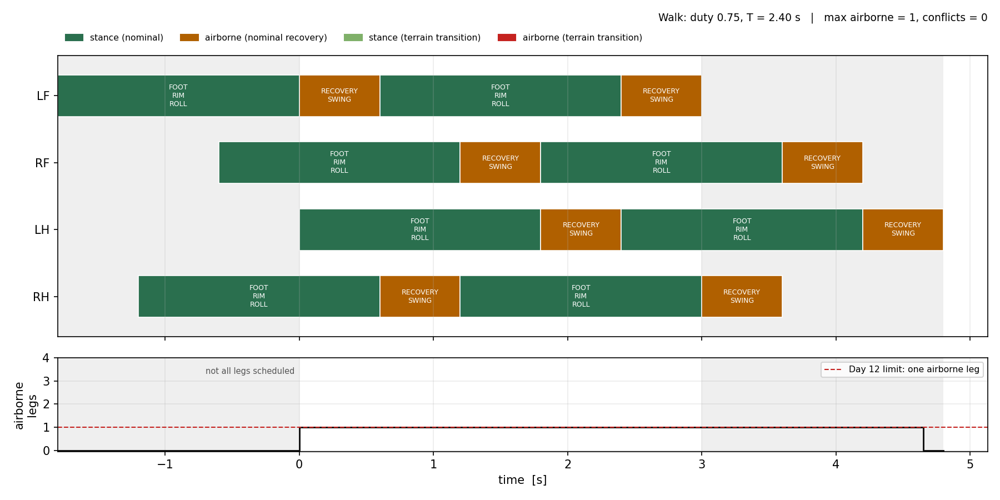

In [34]:
plot_timeline_2d(schedule, path=DAY12 / "day12_step3_timeline.png")
display(Image(filename=str(DAY12 / "day12_step3_timeline.png")))

## 3.5 Step 3 驗收（規格 §10 的八項）

| # | 要求 | 結果 |
|---|---|---|
| 1 | reuse 既有 duty / swing_phase / leg order | ✅ 讀 `GAIT_LIBRARY["Walk"]`，並驗證窗口鋪滿一圈 |
| 2 | planner offline，不進 runtime | ✅ 純資料結構 |
| 3 | 同時最多一隻腳 airborne | ✅ 實跑 `max_airborne_count = 1` |
| 4 | 每腳每個區間 state 明確 | ✅ covered interval 上取樣驗過 |
| 5 | 支援任意 `MotionSegment2D` 序列 | ✅ 輸入是 `SegmentChain2D`，terrain-transition chain 有測試 |
| 6 | 暴露 swing leg / 三支撐 / segment index+kind / 起訖時間 | ✅ |
| 7 | 先不解 support polygon | ✅ 只回傳腿，沒有多邊形或 margin |
| 8 | 四腳 timeline 圖 | ✅ ＋ airborne 計數 panel |

**Step 3 交給 Step 4 的東西**

```text
GaitTiming2D            .phase_at / .mode_at / .swing_window
FourLegSchedule2D       .segments_of(leg) / .airborne_legs_at / .support_legs_at
                        .swing_leg_at（多腳在空中時【丟例外】，不默默回一隻）
                        .covered_interval_s / .ragged_intervals_s
                        .conflicts          <- Step 4 放 terrain transition 進來時會用到
ScheduledSegment2D      .duration_is_assigned = True   時間是指定的，不是量的
量測                     swing/stance 的 β 角速度比 = 10.553 x（與週期無關）
```

**Step 4 要做的**：把 Day 10–11 的 per-leg terrain-transition sequence
放上這條共同時間軸——那時空中段會比一個 swing 窗口長，
`conflicts` 就會開始非空，而 Step 3 已經準備好把它報出來。

In [35]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py",
     "tests/test_day12_four_leg_state_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])

89 passed in 111.59s (0:01:51)


In [36]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py",
     "tests/test_day12_four_leg_state_2d.py",
     "tests/test_day12_timing_skeleton_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])

116 passed in 147.12s (0:02:27)


---

# Step 4 — 把 Day 10–11 的 Per-Leg Sequence 放上共同時間軸

規格 §11。Day 10–11 已經決定好越障要做什麼動作，Step 4 只決定**何時**，
並且把**放不下的部分報出來**，不調整任何東西。

## 4.1 呼叫 composer 不等於重做決策

`decide_2d()` 是**純表格查詢**（讀前面各步驟凍結下來的 CSV），
`compose_2d()` 只是把已經決定好的策略**產生成動作**。
重做決策會長成「這裡自己寫一個 if/else 挑 ROLL 還是 SWING」——這裡沒有那種東西。
下面連 cell 都是引用 Day 10–11 Step 9 自己用的那個（`_first_winning_top`），
所以連「在哪個地形上示範」都不是 Step 4 挑的。

## 4.2 ascent 與 descent 不可以被壓成一個決定

規格點名不要寫成 `this obstacle = ROLL`。每一段都掛一個 `TransitionPhase`，
而且是**從 `SegmentKind` 讀出來**的，不是從幾何猜的——
`SegmentKind` 本身就已經叫 `ROLL_UP` / `ROLL_DOWN` / `SWING_UP` / `SWING_DOWN`，
再從 x 座標推一次只會多一個會和它打架的真相來源。

`#5 SWING_OVER` 是唯一真的「上下是同一個決定」的情況：
它拿到自己的 `OVER` phase，而 `phases_are_separable` 直接回 `False`——
**不是缺一個切分，是本來就沒有**。

In [37]:
from hybrid_note.scripts.experiments.day10_11_composer_2d import compose_2d
from hybrid_note.scripts.experiments.day10_11_decision_map_2d import (
    StrategyId, decide_2d, load_tables_2d,
)
from hybrid_note.scripts.experiments.day12_transition_mapping_2d import (
    TransitionPhase, TRANSITION_PHASE_OF_KIND, STRATEGY_HALVES,
    build_leg_plan_2d, plan_four_legs_2d, airborne_overruns_2d, debug_rows,
)

tables = load_tables_2d(NOTES / "day10-11", NOTES / "day6-7")

def first_winning_top(height_m, strategy):
    for i in range(87):
        top = round(0.02 + 0.005 * i, 4)
        if decide_2d(height_m, top, tables).winner is strategy:
            return top
    return None

display(pd.DataFrame(
    [{"segment_kind": k.value, "phase": v.value}
     for k, v in TRANSITION_PHASE_OF_KIND.items()]))
from hybrid_note.scripts.experiments.day10_11_motion_schema_2d import SegmentKind
unmapped = [k.value for k in SegmentKind
            if k.is_terrain_transition and k not in TRANSITION_PHASE_OF_KIND]
print(f"沒有對應 phase 的 terrain-transition kind: {unmapped or '（沒有）'}")
display(pd.DataFrame([{"strategy": k.value, "ascent": up, "descent": down}
                      for k, (up, down) in STRATEGY_HALVES.items()]))

,segment_kind,phase
0,APPROACH,ASCENT
1,ROLL_UP,ASCENT
2,SWING_UP,ASCENT
3,WHEEL_TRANSITION,ON_TOP
4,ROLL_DOWN,DESCENT
5,SWING_DOWN,DESCENT
6,POST_TOUCHDOWN_ROLL,DESCENT
7,SWING_OVER,OVER
8,TOP_REPOSITION_SWING,ON_TOP


沒有對應 phase 的 terrain-transition kind: （沒有）


,strategy,ascent,descent
0,#1 ROLL_UP + ROLL_DOWN,ROLL_UP,ROLL_DOWN
1,#2 ROLL_UP + SWING_DOWN,ROLL_UP,SWING_DOWN
2,#3 SWING_UP + ROLL_DOWN,SWING_UP,ROLL_DOWN
3,#4 SWING_UP + SWING_DOWN,SWING_UP,SWING_DOWN
4,#5 SWING_OVER,SWING_OVER,SWING_OVER


## 4.3 一個真的越障，放上時間軸

用 `#4 SWING_UP + SWING_DOWN`（Day 10–11 Step 9 自己組過的那一格）。
`build_leg_plan_2d` 在越障**前後各插一個 nominal cycle**（規格要求 3），
中間原封不動放 Day 10–11 產生的段。

In [38]:
h4 = 0.080
top4 = first_winning_top(h4, StrategyId.SWING_SWING)
composed4 = compose_2d(h4, top4, tables, strategy=StrategyId.SWING_SWING)
print(f"#4 at h = {h4*1e3:.0f} mm, L_top = {top4*1e3:.0f} mm  ->  "
      f"composed = {composed4.composed}")

plans4 = {leg: build_leg_plan_2d(leg, composed4) for leg in LEG_ORDER}
four4 = plan_four_legs_2d(plans4, walk_timing_2d())

lf = plans4[LegId.LF]
print(f"\nascent / descent  {lf.ascent_strategy} / {lf.descent_strategy}"
      f"   separable = {lf.phases_are_separable}")
for phase in TransitionPhase:
    n = len(lf.segments_in(phase))
    if n:
        print(f"  {phase.value:16s} {n} segment(s)")

carried = [p.segment for p in lf.transition_segments]
print(f"\n越障那幾段是 Day 10-11 的【同一個物件】（不是複製、不是重算）: "
      f"{all(a is b for a, b in zip(carried, composed4.sequence.segments))}")

#4 at h = 80 mm, L_top = 240 mm  ->  composed = True

ascent / descent  SWING_UP / SWING_DOWN   separable = True
  NOMINAL_BEFORE   2 segment(s)
  ASCENT           1 segment(s)
  DESCENT          1 segment(s)
  NOMINAL_AFTER    2 segment(s)

越障那幾段是 Day 10-11 的【同一個物件】（不是複製、不是重算）: True


In [39]:
rows4 = pd.DataFrame(debug_rows(four4))
seg4 = rows4[rows4["row_kind"] == "segment"]
display(seg4[seg4["leg"] == "LF"][
    ["start_s", "end_s", "leg", "segment_kind", "contact_state",
     "phase", "body_kind"]].reset_index(drop=True))

,start_s,end_s,leg,segment_kind,contact_state,phase,body_kind
0,-1.8,0.0,LF,FOOT_RIM_ROLL,STANCE,NOMINAL_BEFORE,track
1,0.0,0.394475,LF,RECOVERY_SWING,AIRBORNE,NOMINAL_BEFORE,lower_bound
2,0.394475,0.497238,LF,SWING_UP,AIRBORNE,ASCENT,lower_bound
3,0.497238,0.6,LF,SWING_DOWN,AIRBORNE,DESCENT,lower_bound
4,0.6,2.4,LF,FOOT_RIM_ROLL,STANCE,NOMINAL_AFTER,track
5,2.4,3.0,LF,RECOVERY_SWING,AIRBORNE,NOMINAL_AFTER,lower_bound


## 4.4 Step 4 抓到的事：swing 窗口把已經排好的動作**壓縮**了

看上面的表：`RECOVERY_SWING`、`SWING_UP`、`SWING_DOWN` **三段都落在同一個
0.6 s 的 swing 窗口裡**。Step 3 的規則是「一個極大空中段配一個 swing 窗口，
段內按 frame 數分」——對 nominal recovery 是對的（窗口本來就是照它定的），
但越障把兩段 swing 塞進同一個 run，同一條規則就變成**默默壓縮**。

而且被壓縮的**不是**沒有時間的東西：Day 8–9 幫每一段 swing 排過
`duration_s = 0.6 s`，Day 10–11 原封帶過來——那是整條鏈上**唯一真實的時間**。
兩段 0.6 s 塞進一個 0.6 s 的窗口 = **正好 2 倍**，而且那個還沒算
同一個窗口裡還有一段沒被指定時間的 recovery。

規格要求 7 說衝突要「偵測並回報，不是藏起來」——所以這件事被量成
`AirborneOverrun2D`，並且會讓 `is_executable` 變成 `False`。
**Step 4 不修它**：要拉長週期、讓那隻腳跨兩個窗口、還是換 duty，是後面的決定。

In [40]:
overruns = pd.DataFrame([o.as_dict() for o in four4.airborne_overruns])
display(overruns)
print(f"timing conflicts（Step 3 的定義）  {len(four4.schedule.conflicts)}")
print(f"airborne overruns（Step 4 加的）   {len(four4.airborne_overruns)}")
print(f"whole plan executable             {four4.is_executable}")
print("\n-> Step 3 的 conflicts 是 0，但計畫【還是】不可執行。"
      "\n   兩個旗標分開存在，正是因為其中一個為零不代表另一個沒事。")

,leg,start_s,end_s,window_s,segment_kinds,planned_s,untimed_segments,compression
0,LF,0.0,0.6,0.6,"RECOVERY_SWING,SWING_UP,SWING_DOWN",1.2,1,2.0
1,RF,1.2,1.8,0.6,"RECOVERY_SWING,SWING_UP,SWING_DOWN",1.2,1,2.0
2,LH,1.8,2.4,0.6,"RECOVERY_SWING,SWING_UP,SWING_DOWN",1.2,1,2.0
3,RH,0.6,1.2,0.6,"RECOVERY_SWING,SWING_UP,SWING_DOWN",1.2,1,2.0


timing conflicts（Step 3 的定義）  0
airborne overruns（Step 4 加的）   4
whole plan executable             False

-> Step 3 的 conflicts 是 0，但計畫【還是】不可執行。
   兩個旗標分開存在，正是因為其中一個為零不代表另一個沒事。


## 4.5 沒解出來的越障，必須繼續空著

`#2 ROLL_UP + SWING_DOWN` 是 Day 10–11 判定**兩個 primitive 接不起來**的組合。
Step 4 把它的 `TransitionRequirement2D` 原封帶到 chain 上，
`is_executable` 為 `False`，debug 表裡有一列 `unresolved_transition`。

**前後的 nominal run 不會把那個洞蓋起來。**
這正是規格要求 5 在防的事：把「還沒解」讀成「不需要」。

In [41]:
composed2 = compose_2d(0.160, 0.350, tables, strategy=StrategyId.ROLL_SWING)
plans2 = {leg: build_leg_plan_2d(leg, composed2) for leg in LEG_ORDER}
four2 = plan_four_legs_2d(plans2, walk_timing_2d())

lf2 = plans2[LegId.LF]
print(f"composed                {composed2.composed}")
print(f"transition segments     {len(lf2.transition_segments)}   <- 洞還在")
print(f"unresolved transitions  {len(lf2.unresolved)}")
print(f"chain.is_complete       {lf2.chain.is_complete}")
print(f"is_executable           {lf2.is_executable}")
rows2 = pd.DataFrame(debug_rows(four2))
display(rows2[rows2["row_kind"] == "unresolved_transition"][
    ["leg", "transition_kind", "target_condition",
     "requires_external_support", "resolved"]].head())

composed                False
transition segments     0   <- 洞還在
unresolved transitions  1
chain.is_complete       False
is_executable           False


,leg,transition_kind,target_condition,requires_external_support,resolved
21,LF,TOP_REPOSITION,a foot-rim take-off on the top above theta = 35 deg (Step 3 F's floor),True,False
24,RF,TOP_REPOSITION,a foot-rim take-off on the top above theta = 35 deg (Step 3 F's floor),True,False
27,LH,TOP_REPOSITION,a foot-rim take-off on the top above theta = 35 deg (Step 3 F's floor),True,False
30,RH,TOP_REPOSITION,a foot-rim take-off on the top above theta = 35 deg (Step 3 F's floor),True,False


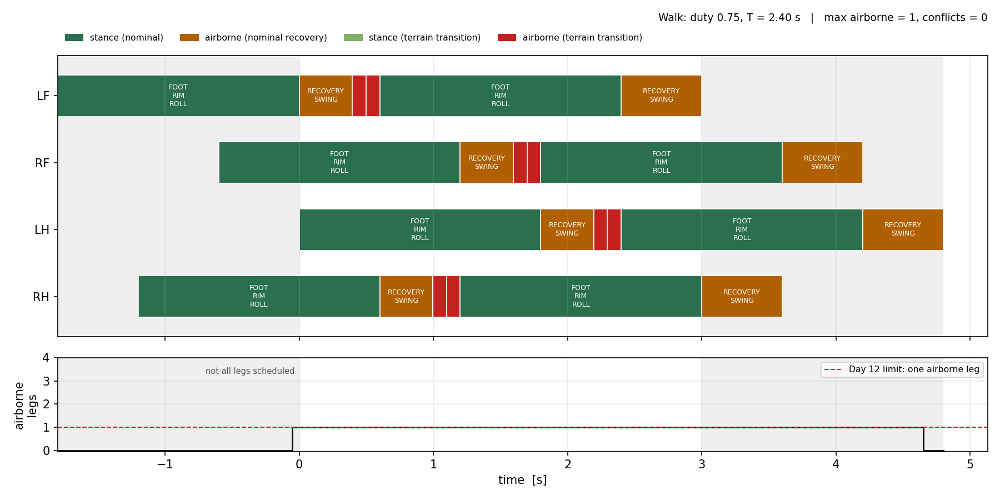

In [42]:
display(Image(filename=str(DAY12 / "day12_step4_timeline.png")))

## 4.6 Step 4 驗收（規格 §11 的八項）

| # | 要求 | 結果 |
|---|---|---|
| 1 | 不重算 ROLL/SWING 決策 | ✅ 只呼叫 `decide_2d`（純查表）與 `compose_2d`；此處沒有任何選擇規則 |
| 2 | ascent / descent 保持獨立 | ✅ 每段掛 `TransitionPhase`；`#5` 誠實回報 `separable = False` |
| 3 | 越障區段外插入 nominal FOOT_RIM_ROLL | ✅ 前後各一個完整 nominal cycle（roll + recovery） |
| 4 | 保留 sampling 與 body requirement | ✅ 段是**同一個物件**，不是複製（用 `is` 驗過） |
| 5 | 未解的 requirement 要明擺著 | ✅ `#2` 帶著 `unresolved`，`is_executable = False` |
| 6 | exit state 要是合法的 entry state | ✅ 用 Step 0 的 `chain_boundaries_2d`，斷點**回報**不修 |
| 7 | 衝突要偵測並回報 | ✅ Step 3 的 `conflicts` ＋ Step 4 新增的 `AirborneOverrun2D` |
| 8 | debug 表 | ✅ `debug_rows()`：時間區間 / 腳 / kind / 接觸狀態 / body requirement |

**Step 4 交給 Step 5 的東西**

```text
LegPlan2D            .phased（每段 + phase + source）/ .chain / .breaks
                     .ascent_strategy / .descent_strategy / .phases_are_separable
                     .unresolved / .is_executable
FourLegPlan2D        .schedule（Step 3 的）/ .airborne_overruns / .is_executable
debug_rows()         規格要求 8 的表，可直接寫 CSV
量測                  越障 swing 的 planned duration 0.6 s x2 塞進 0.6 s 窗口
                     -> compression = 2.0 x（還沒算同窗口裡的 recovery）
```

**Step 5 要做的**：body requirement → whole-body trajectory（規格 §12）。
Step 4 已經把每一段的 `body_requirement` 原封帶到時間軸上，
Step 5 是第一個真的去**滿足**它們的步驟。

In [43]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py",
     "tests/test_day12_four_leg_state_2d.py",
     "tests/test_day12_timing_skeleton_2d.py",
     "tests/test_day12_transition_mapping_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])

156 passed in 213.49s (0:03:33)


---

# Step 5 — Body Requirement → Whole-Body Trajectory

規格 §12。Day 10–11 說了每隻腳需要 body 怎麼配合，Step 4 把這些需求放上同一個時鐘。
Step 5 把它們合成**一條** `body_x(t)` / `body_z(t)`——
**deterministic、沒有 optimizer**（要求 4），而且**衝突時拒絕，不平均**（要求 5）。

## 5.1 合併規則只有一個函式

```text
hard（TRACK / PINNED）有兩個以上而且不合  ->  INFEASIBLE（記下誰跟誰差多少）
hard 只有一個（或彼此相容）                ->  body_z = 那個值
沒有 hard                                ->  body_z = max(active lower bounds, nominal)
```

`hip_z -> body_z` 用的是 Step 2 已經定好的關係
（`body_z = hip_z - ABAD_AXIS_OFFSET`），不是新數字。

**CoM 的說法**：這個 2D pipeline 沒有 whole-robot 質量模型，
所以每一列都掛著 `quasi-static body-frame approximation`——
標籤在**資料上**，這樣它不會在往 paper 的路上被弄丟。

In [44]:
from hybrid_note.scripts.experiments.day10_11_composer_2d import ComposedSequence2D
from hybrid_note.scripts.experiments.day12_body_trajectory_2d import (
    BODY_BASIS, HIP_TO_BODY_Z_M, HARD_AGREEMENT_M,
    BodyDriver, LegDemand2D, body_trajectory_2d, body_rows, merge_demands,
)
from hybrid_note.scripts.experiments.day10_11_motion_schema_2d import BodyRequirementKind
from legwheel.config import RobotParams

print(f"basis                {BODY_BASIS}")
print(f"hip -> body offset   {HIP_TO_BODY_Z_M*1e3:.3f} mm"
      f"   == RobotParams.ABAD_AXIS_OFFSET: "
      f"{HIP_TO_BODY_Z_M == RobotParams.ABAD_AXIS_OFFSET}")

NOM = 0.162283
def demand(leg, kind, z):
    return LegDemand2D(leg=leg, segment_index=0, segment_kind="FOOT_RIM_ROLL",
                       phase=None, kind=kind, body_z_m=z, mode=LegMode.STANCE)

cases = {
    "沒有讓步": [],
    "一個下界": [demand(LegId.LF, BodyRequirementKind.LOWER_BOUND, NOM + 0.020)],
    "多個相容下界": [demand(LegId.LF, BodyRequirementKind.LOWER_BOUND, NOM + 0.010),
                     demand(LegId.RF, BodyRequirementKind.LOWER_BOUND, NOM + 0.025)],
    "互斥的 hard": [demand(LegId.LF, BodyRequirementKind.TRACK, 0.20),
                    demand(LegId.RH, BodyRequirementKind.TRACK, 0.24)],
}
for name, ds in cases.items():
    z, driver, winner, conflicts = merge_demands(ds, NOM, 0.0)
    shown = "nan" if np.isnan(z) else f"{z*1e3:.3f} mm"
    print(f"  {name:14s} body_z = {shown:12s}"
          f"   driver = {driver.value:11s} conflicts = {len(conflicts)}")
print("\n-> 互斥的那一列【不會】產生 0.22 m 這個中點。規格要求 5。")

basis                quasi-static body-frame approximation (no whole-robot CoM model)
hip -> body offset   57.166 mm   == RobotParams.ABAD_AXIS_OFFSET: True
  沒有讓步           body_z = 162.283 mm     driver = nominal     conflicts = 0
  一個下界           body_z = 182.283 mm     driver = lower_bound conflicts = 0
  多個相容下界         body_z = 187.283 mm     driver = lower_bound conflicts = 0
  互斥的 hard       body_z = nan            driver = infeasible  conflicts = 1

-> 互斥的那一列【不會】產生 0.22 m 這個中點。規格要求 5。


## 5.2 Step 5 最重要的結果：**平地四腳 nominal cycle 是 INFEASIBLE**

這不是 merge 寫壞，是 merge 照規格做事之後**問出來的真相**。

foot-rim 滾動的 hip 高度是一段**弧**（Step 1 量的）：
兩端 202.161 mm、中間（α = 0）219.448 mm，一個 stroke 起伏 **17.287 mm**。

Walk 的 phase offset 把三隻站立腳放在這條弧的**三個不同位置**，
於是在同一個瞬間，三隻腳各自要求一個不同的 body 高度——
而它們全都是 `TRACK`，**TRACK 是 hard**。

In [45]:
probe = cycle_segments_2d(run_nominal_cycles_2d(1)[0], source_id="nb_probe")[0]
prof = probe.body_requirement.hip_z_profile_m
print(f"一個 stroke 的 hip_z：兩端 {prof[0]*1e3:.3f} mm，"
      f"最高 {prof.max()*1e3:.3f} mm，起伏 {(prof.max()-prof.min())*1e3:.3f} mm")

fig, ax = plt.subplots(figsize=(7.5, 2.6))
ax.plot(np.linspace(0, 1, len(prof)), prof * 1e3, color="#1a1a1a", lw=1.6)
for frac, colour in ((0.0, "#c5221f"), (1/3, "#b06000"), (2/3, "#2a6f4e")):
    i = int(frac * (len(prof) - 1))
    ax.scatter([frac], [prof[i] * 1e3], s=45, color=colour, zorder=3)
    ax.annotate(f"{prof[i]*1e3:.1f}", (frac, prof[i] * 1e3),
                textcoords="offset points", xytext=(4, 6), fontsize=8,
                color=colour)
ax.set_xlabel("phase within the stroke"); ax.set_ylabel("hip_z [mm]")
ax.set_title("three stance legs sit at three points on one arc",
             fontsize=9, loc="right")
ax.grid(alpha=0.25); fig.tight_layout(); plt.show()

一個 stroke 的 hip_z：兩端 202.161 mm，最高 219.448 mm，起伏 17.287 mm


<Figure size 750x260 with 1 Axes>

In [46]:
composed_flat = ComposedSequence2D(
    strategy=StrategyId.SWING_SWING, height_m=0.0, top_length_m=0.0,
    sequence=None, refusal="flat run, no crossing")
plans_flat = {leg: build_leg_plan_2d(leg, composed_flat) for leg in LEG_ORDER}
four_flat = plan_four_legs_2d(plans_flat, walk_timing_2d())

state_nom = initialize_four_leg_state_2d(SharedTerrainSpec2D(
    height_m=0.04, top_length_m=0.40, x_start_m=1.00,
    obstacle_id="day12_platform"))
traj = body_trajectory_2d(
    four_flat, nominal_body_z_m=float(state_nom.body_position_world_m[2]))

summary = traj.as_dict()
print(f"取樣                {summary['samples']}")
print(f"可行的取樣          {summary['feasible_samples']}")
print(f"conflicts           {summary['conflict_count']}"
      f"   feasible = {summary['is_feasible']}")
print(f"最嚴重的分歧        {summary['max_disagreement_mm']:.3f} mm"
      f"   （上界就是那 17.287 mm）")
display(pd.DataFrame([c.as_dict() for c in traj.conflicts[:5]]))

取樣                241
可行的取樣          1
conflicts           451   feasible = False
最嚴重的分歧        15.329 mm   （上界就是那 17.287 mm）


,time_s,leg_a,leg_b,body_z_a_mm,body_z_b_mm,disagreement_mm
0,0.0000,LF,RF,144.994700,160.229828,15.235127
1,0.0000,LF,RH,144.994700,160.323362,15.328662
2,0.0125,RF,LH,160.386973,145.366543,15.020431
3,0.0250,RF,LH,160.544119,145.738385,14.805734
4,0.0375,RF,LH,160.701264,146.110227,14.591037


所以 Step 5 **不會**交給你一條平滑的 `body_z` 曲線。那條曲線要存在，
得先承認下面三條路之一：

```text
(a) body 允許 heave / pitch      -> 但規格 §12 要求 6 在對稱測試裡把 rpy 釘在 0
(b) 每隻腳用 theta 補償弧的起伏   -> 那是 joint trajectory（Step 8）的事
(c) 換一個 hip 高度不隨滾動起伏的 nominal cycle
```

**三條都不是 Step 5 可以自己決定的**，所以 Step 5 的正確輸出就是
「不可行，而且這是誰跟誰差多少」。

> 這條和 Step 4 的 airborne overrun 是**兩件獨立的事**：
> 一個是**時間**放不下（0.6 s 的窗口要裝 1.2 s），
> 一個是**高度**對不起來（15.3 mm）。兩個都在，而且互不掩蓋。

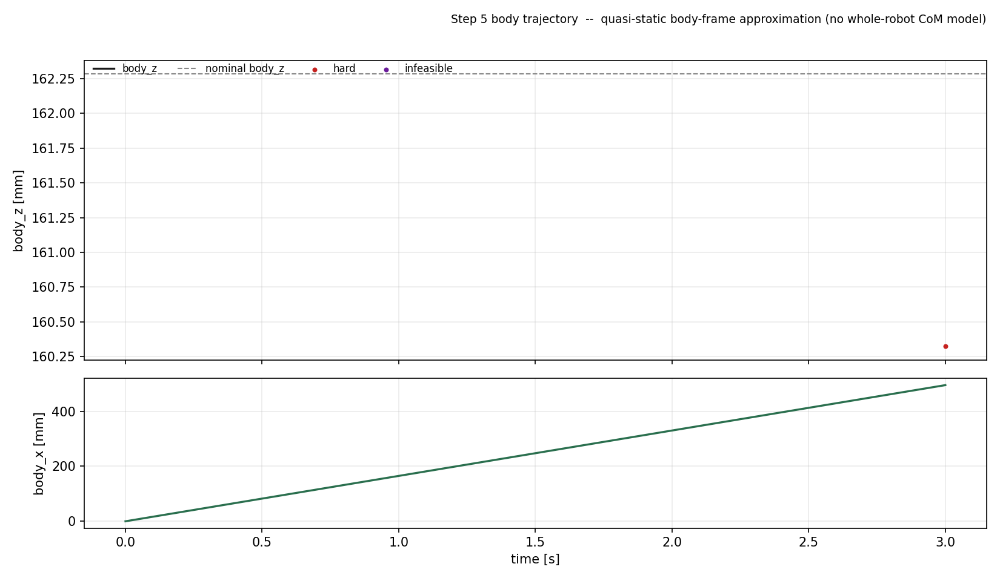

In [47]:
display(Image(filename=str(DAY12 / "day12_step5_body_trajectory.png")))

## 5.3 Step 5 驗收（規格 §12 的九項）

| # | 要求 | 結果 |
|---|---|---|
| 1 | 吃 Step 4 同步過的 requirement timeline | ✅ 直接讀 `FourLegPlan2D` |
| 2 | HARD（TRACK/PINNED）必須滿足 | ✅ hard 一律壓過 lower bound |
| 3 | LOWER_BOUND 取滿足所有 active 腳的最小 | ✅ 取最大下界，且**不會**把 body 往下拉 |
| 4 | 不加 optimizer | ✅ `merge_demands()` 是純規則 |
| 5 | 互斥 hard → infeasible，不平均 | ✅ 回 NaN ＋ `BodyConflict2D`；有測試擋住中點 |
| 6 | body_x/z 連續、y 與 rpy 維持 nominal | ✅ body_x 單調連續；y/rpy 掛在資料上可驗 |
| 7 | 與四腳同步的取樣 | ✅ 在 `covered_interval_s` 上取樣 |
| 8 | 記錄垂直變化 | ✅ `body_z_travel_m`，跳過 NaN，不被 infeasible 抹掉 |
| 9 | 四個測試情境 | ✅ 無讓步 / 一個下界 / 多個相容下界 / 互斥 hard |

**Step 5 交給 Step 6 的東西**

```text
BodyTrajectory2D   .samples（每個都帶 driver_leg / driver_segment）
                   .conflicts / .is_feasible / .concession_intervals()
                   .body_z_travel_m / .max_body_z_step_m
merge_demands()    規則本身，可單獨測試與重用
BODY_BASIS         「這是 body frame 近似，不是 whole-robot CoM」
【要帶著走的結論】  平地四腳 nominal cycle 不可行，最大分歧 15.329 mm
```

**Step 6 要做的**：三腳 support triangle ＋ CoM stability margin（規格 §13）。
開始之前要先知道：Step 5 已經說了 body 高度本身就對不起來，
所以 Step 6 的穩定性結論必須說清楚它是在**哪一個** body 假設下算的。

In [48]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py",
     "tests/test_day12_four_leg_state_2d.py",
     "tests/test_day12_timing_skeleton_2d.py",
     "tests/test_day12_transition_mapping_2d.py",
     "tests/test_day12_body_trajectory_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])

180 passed in 169.66s (0:02:49)


---

# Step 6 — 三腳 Support Triangle + Stability Margin

規格 §13。一隻腳在空中時，另外三隻撐住機器人。這一步在**水平面**上建它們的
support triangle，把 body 中心投影上去，並且**沿整個 swing** 取樣 signed margin
——不是只看 liftoff 那一幀，因為滾動中的支撐腳接觸點會在 swing 期間移動。

## 6.1 三個不能弄丟的標籤

```text
contact，不是 hip     規格特別點名。用「接觸點【相對髖】的 x」，
                     所以與 chain 那個任意的 x 原點無關。
body 中心，不是 CoM   沒有 whole-robot 質量模型，每一列都標明這件事。
body_z 不可行         Step 5 的結論。margin 是【水平】問題、body_x 仍良定義，
                     所以算得下去——但這個前提要跟著答案一起走。
```

`gamma = 0`（要求 8），所以每隻腳的矢狀面固定在它自己的 y，
橫向座標直接用 Step 2 量到的 mounting offset，不需要新模型。

In [49]:
from hybrid_note.scripts.experiments.day12_support_stability_2d import (
    COM_BASIS, GAMMA_RAD, BOUNDARY_TOLERANCE_S, DEGENERATE_AREA_M2,
    SupportTriangle2D, contact_offset_from_hip_m,
    support_triangle_at, swing_stability_2d, stability_rows, plot_stability_2d,
)

print(f"gamma       {GAMMA_RAD}   (Day 12 不調 ABAD)")
print(f"CoM basis   {COM_BASIS}")
print("\n橫向座標 = Step 2 的 mounting offset（不是新數字）")
for m in leg_mounts_2d(GAMMA_RAD):
    r = m.as_dict()
    print(f"  {r['leg']}  x {r['offset_x_mm']:+8.3f}  y {r['offset_y_mm']:+9.3f} mm")

# inside / boundary / outside，用手算的直角三角形（規格要求 10）
unit = np.array([(0.0, 0.0), (1.0, 0.0), (0.0, 1.0)])
tri = SupportTriangle2D(time_s=0.0, swing_leg=None,
                        support_legs=(LegId.RF, LegId.LH, LegId.RH),
                        points_xy_m=unit)
for name, point in (("inside", (0.2, 0.2)), ("boundary", (0.5, 0.0)),
                    ("outside", (-0.3, 0.5))):
    print(f"  {name:9s} margin = {tri.signed_margin_m(point):+.4f} m")

gamma       0.0   (Day 12 不調 ABAD)
CoM basis   body centre projected on the horizontal plane -- quasi-static body-frame approximation, NOT a whole-robot CoM

橫向座標 = Step 2 的 mounting offset（不是新數字）
  LF  x +255.000  y  +211.675 mm
  RF  x +255.000  y  -211.675 mm
  LH  x -255.000  y  +211.675 mm
  RH  x -255.000  y  -211.675 mm
  inside    margin = +0.2000 m
  boundary  margin = +0.0000 m
  outside   margin = -0.3000 m


## 6.2 Step 6 的結果：**margin 最小 0.000 mm，五個 swing 全部不穩**

**為什麼剛好是 0：對稱，不是捨入誤差。**
LH / RH 這兩個 swing 起跳的瞬間，對角的兩隻支撐腳量到在
`(+239.2, -211.7)` 與 `(-239.2, +211.7)` mm——**對 body 中心完全對稱**，
所以連接它們的那條邊**正好通過 body 中心**，margin 因此正好是 0。

另外三個 swing 沒有那個對稱，但最好也只有 **0.995 mm**。
整趟從來沒有超過 1 mm 的餘裕。

In [50]:
stability = swing_stability_2d(four_flat, traj)
summary = stability.as_dict()
print(f"body 假設     {summary['body_basis']}")
print(f"swings        {summary['swings']}   unstable = {summary['unstable_swings']}")
print(f"margin floor  {summary['margin_floor_mm']:.1f} mm   （規劃門檻，不是量到的物理極限）")
print(f"最小 margin   {summary['minimum_stability_margin_mm']:.3f} mm")
print(f"stable        {summary['stable']}")

rows6 = pd.DataFrame(stability_rows(stability))
display(rows6[rows6["row_kind"] == "swing"][
    ["swing_leg", "support_legs", "start_s", "end_s",
     "minimum_stability_margin_mm", "worst_time_s", "stable"]
].reset_index(drop=True))

body 假設     body_x from Step 5; body_z INFEASIBLE (Step 5, 451 conflicts) -- quasi-static body-frame approximation (no whole-robot CoM model)
swings        5   unstable = 5
margin floor  10.0 mm   （規劃門檻，不是量到的物理極限）
最小 margin   0.000 mm
stable        False


,swing_leg,support_legs,start_s,end_s,minimum_stability_margin_mm,worst_time_s,stable
0,LF,"RF,LH,RH",0.0,0.6,0.995109,0.571429,False
1,LF,"RF,LH,RH",2.4,3.0,0.995109,2.971429,False
2,RF,"LF,LH,RH",1.2,1.8,0.995109,1.771429,False
3,LH,"LF,RF,RH",1.8,2.4,0.0,1.8,False
4,RH,"LF,RF,LH",0.6,1.2,0.0,0.6,False


## 6.3 順便證明了規格要求 5 是對的

「只檢查 liftoff 那一幀」會怎樣？RF 的 swing 在**起跳時** margin 是 **20.897 mm**，
輕鬆通過 10 mm 門檻——但它在 swing 期間**線性衰減**到 0.995 mm。
只看第一幀會把一個不穩的 swing 判成穩的。

衰減是線性的原因也很直接：body 一直往前走，而支撐腳的接觸點留在原地。

In [51]:
rf = next(s for s in stability.swings if s.swing_leg is LegId.RF)
margins = [s.margin_m * 1e3 for s in rf.samples]
print(f"RF swing [{rf.start_s:.3f}, {rf.end_s:.3f}] s")
print(f"  起跳時       {margins[0]:8.3f} mm   <- 只看這一幀就會判定通過")
print(f"  最小         {rf.minimum_margin_m*1e3:8.3f} mm")
print(f"  單調遞減     {all(a >= b - 1e-12 for a, b in zip(margins, margins[1:]))}")
print(f"  stable       {rf.is_stable}")

RF swing [1.200, 1.800] s
  起跳時         20.897 mm   <- 只看這一幀就會判定通過
  最小            0.995 mm
  單調遞減     True
  stable       False


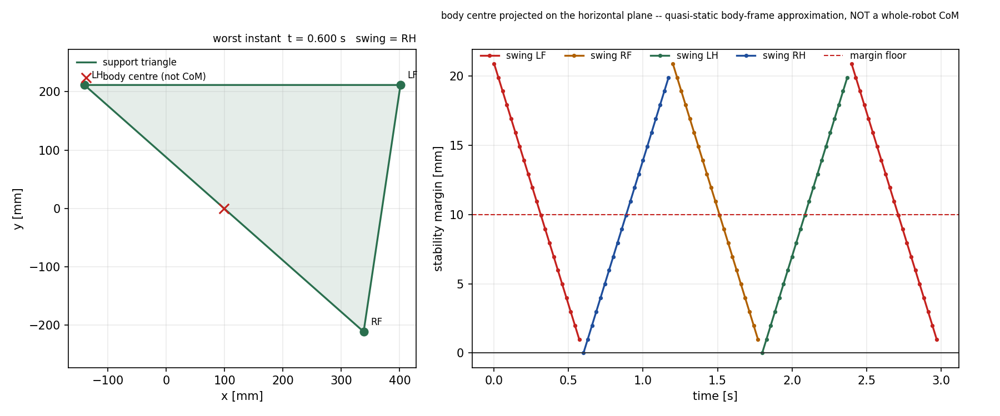

In [52]:
plot_stability_2d(four_flat, traj, stability,
                  path=DAY12 / "day12_step6_stability.png")
display(Image(filename=str(DAY12 / "day12_step6_stability.png")))

## 6.4 Step 6 驗收（規格 §13 的十項）

| # | 要求 | 結果 |
|---|---|---|
| 1 | 用實際 world contact point | ✅ 相對髖的偏移，與 chain 原點無關（有平移不變測試） |
| 2 | 水平面 support triangle | ✅ 橫向用 Step 2 的 mounting offset |
| 3 | CoM 投影 | ✅ body 中心，且每列都標明它不是 whole-robot CoM |
| 4 | signed margin | ✅ inside / boundary / outside 都有測試 |
| 5 | 整個 swing 都要算 | ✅ 而且證明了只看 liftoff 會誤判（20.897 → 0.995 mm） |
| 6 | 每個 swing 與整趟都存最小 margin | ✅ 含「最小發生在哪一刻」 |
| 7 | margin 不足 → 標記 infeasible | ✅ 5 個 swing 全部 unstable |
| 8 | gamma 維持 0 | ✅ `GAMMA_RAD = 0.0`，有測試 |
| 9 | 視覺化 | ✅ 最差瞬間的三角形 + CoM + swing leg，右側 margin 對時間 |
| 10 | inside / boundary / outside 單元測試 | ✅ 用手算的直角三角形，不用 planner 輸出 |

## 6.5 目前累積、**互相獨立**的三個未解結論

```text
Step 4  時間放不下   0.6 s 的 swing 窗口要裝 1.2 s 的已排動作（2.000 x）
Step 5  高度對不起來 三隻站立腳要求的 body 高度差 15.329 mm  -> INFEASIBLE
Step 6  沒有餘裕     margin 最小 0.000 mm，五個 swing 全部 unstable
```

三個都**不是 bug**，都是規格要求「要問出來」的東西。不要合成一個「還沒好」。
規格自己指的路是 **Day 13–14 調 gamma**（改變橫向支撐幾何）——
Day 12 只做 feasibility。

In [53]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py",
     "tests/test_day12_four_leg_state_2d.py",
     "tests/test_day12_timing_skeleton_2d.py",
     "tests/test_day12_transition_mapping_2d.py",
     "tests/test_day12_body_trajectory_2d.py",
     "tests/test_day12_support_stability_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])

208 passed in 170.68s (0:02:50)


---

# Step 7 — Resolve `TOP_REPOSITION`

規格 §14。Day 10–11 **故意**把這兩個 case 留成未解：單腳 planner 不可能知道
另外三隻腳撐不撐得住 body。Day 12 是第一個能問這個問題的地方。

## 7.1 順序是「支撐先、動作後」

先生成軌跡再檢查支撐，會產生一條「看起來像答案、但那個問題根本還沒被允許問」的軌跡。
所以 gate 沒過就**完全不生成**（規格要求 4：也不准發明 ABAD 補償）。

而且**不寫第二套 swing generator**（規格明令）。重用鏈全是現成的：

```text
standing_scene_2d / left_rim_landing_scene_2d
        ↓
build_swing_request_2d      <- Day 8-9 的既有 builder
        ↓
generate_swing_2d           <- 內建碰撞與 touchdown 驗證（要求 7 靠重用滿足）
        ↓
segment_from_swing_plan_2d  <- Day 10-11 已有的寫入 schema 的函式
```

## 7.2 `resolved = True` 不能寫回 requirement

`TransitionRequirement2D` 自己擋：

> a resolved transition is a segment, not a requirement:
> replace the record with the motion that solves it.

所以產出是一個 **attempt 記錄**，同時放**原始 requirement**（要求 10 的追溯）
與**生成出來的 segment**。不是把旗標翻掉。

In [54]:
from hybrid_note.scripts.experiments.day10_11_decision_map_2d import BLOCKED_PAIRS
from hybrid_note.scripts.experiments.day12_top_reposition_2d import (
    REPOSITION_TARGETS, TARGET_THETA_HEADROOM_RAD, DEFAULT_LANDING_BETA_STEP_DEG,
    RepositionOutcome, resolve_top_reposition_2d, reposition_rows,
)
from hybrid_note.scripts.experiments.day12_support_stability_2d import (
    DEFAULT_MARGIN_FLOOR_M,
)

BLOCKED_CELLS = {
    StrategyId.ROLL_SWING: (0.160, 0.350),
    StrategyId.SWING_ROLL: (0.140, 0.225),
}

print("Day 10-11 留下的兩個未解 case  (規格 §14 要求 9)")
for strategy, (h, l) in BLOCKED_CELLS.items():
    t = REPOSITION_TARGETS[strategy]
    bound = ""
    if t.theta_min_rad is not None:
        bound += f", theta >= {np.rad2deg(t.theta_min_rad):.0f} deg"
    if t.theta_max_rad is not None:
        bound += f", theta <= {np.rad2deg(t.theta_max_rad):.0f} deg"
    print(f"  {strategy.value}   h = {h*1e3:.0f} mm, L_top = {l*1e3:.0f} mm")
    print(f"    Day 10-11 verdict   {BLOCKED_PAIRS[strategy].verdict.value}")
    print(f"    target（可檢查版）   {t.rim.value}{bound}")

Day 10-11 留下的兩個未解 case  (規格 §14 要求 9)
  #2 ROLL_UP + SWING_DOWN   h = 160 mm, L_top = 350 mm
    Day 10-11 verdict   DIRECT_HANDOFF_INFEASIBLE
    target（可檢查版）   foot_rim, theta >= 35 deg
  #3 SWING_UP + ROLL_DOWN   h = 140 mm, L_top = 225 mm
    Day 10-11 verdict   DIRECT_HANDOFF_INFEASIBLE
    target（可檢查版）   left_rim, theta >= 15 deg, theta <= 25 deg


## 7.3 planning floor 下的答案：**支撐不足**

Step 6 已經量到平地走路的 margin 最小只有 0.995 mm，門檻是 10 mm。
所以兩個 case 在 gate 就停住，**沒有生成任何軌跡**。

規格 §14 的驗收本來就接受兩種結果之一——`resolved = True`，
或**明確的 support-related failure reason**。這是後者，而且理由是真的。

In [55]:
planning = [resolve_top_reposition_2d(four_flat, traj, strategy, h, l,
                                      leg=LegId.LF)
            for strategy, (h, l) in BLOCKED_CELLS.items()]

for a in planning:
    print(f"\n{a.strategy.value}")
    print(f"  outcome            {a.outcome.value}")
    print(f"  reason             {a.reason}")
    print(f"  生成了軌跡嗎        {a.segment is not None}   <- gate 沒過就不生成")
    print(f"  原始失敗原因保留    {a.original_evidence[:110]}...")


#2 ROLL_UP + SWING_DOWN
  outcome            support_insufficient
  reason             minimum support margin over the interval is 0.995 mm, below the 10.0 mm floor
  生成了軌跡嗎        False   <- gate 沒過就不生成
  原始失敗原因保留    Step 3 D/E -- (a) handing over directly from the right rim crosses the alpha = +40 deg rim seam; (b) the Day 6...

#3 SWING_UP + ROLL_DOWN
  outcome            support_insufficient
  reason             minimum support margin over the interval is 0.995 mm, below the 10.0 mm floor
  生成了軌跡嗎        False   <- gate 沒過就不生成
  原始失敗原因保留    Step 2b -- a swing lands on the foot rim at alpha ~ 0 deg, while roll-down needs the left rim near the trailin...


## 7.4 把支撐放寬之後（**探索，不是答案**）

為了證明 gate 兩個方向都會動，用一個低到一定會過的 floor 再跑一次。
每一列都被標上 `relaxed_floor`，不會被讀成結論。

- **`#2`** 走完整條鏈：Day 8–9 的 swing 通過碰撞與 touchdown 驗證，
  落在 foot rim、θ ≈ 37°，滿足「≥ 35°」——**`resolved = True`**。
- **`#3`** 卡在 `JOINT_DISCONTINUITY`。這是一個**真發現**：
  `LEFT_RIM_READY` 要的是左輪緣承載，而那需要一個離起始姿態很遠的 β，
  一個直接的 swing 過不去。換句話說 `#3` 的 reposition
  **不是「支撐夠了就能做」，它還缺一段把 β 轉過去的動作。**

In [56]:
relaxed = [resolve_top_reposition_2d(four_flat, traj, strategy, h, l,
                                     leg=LegId.LF, margin_floor_m=-1.0,
                                     landing_beta_step_deg=2.0)
           for strategy, (h, l) in BLOCKED_CELLS.items()]

for a in relaxed:
    row = a.as_dict()
    print(f"\n{a.strategy.value}   [relaxed_floor = {a.relaxed_floor}]")
    print(f"  outcome        {row['outcome']}")
    print(f"  swing valid    {row['swing_valid']}   failure = {row['swing_failure']}")
    print(f"  segment kind   {row['segment_kind']}")
    print(f"  touchdown      rim {row['touchdown_rim']}, "
          f"theta {row['touchdown_theta_deg']}")
    print(f"  reason         {a.reason}")

rows7 = pd.DataFrame(reposition_rows(planning + relaxed))
display(rows7[rows7["row_kind"] == "attempt"][
    ["strategy", "relaxed_floor", "outcome", "resolved",
     "support_minimum_margin_mm", "touchdown_rim", "touchdown_theta_deg"]
].reset_index(drop=True))


#2 ROLL_UP + SWING_DOWN   [relaxed_floor = True]
  outcome        resolved
  swing valid    True   failure = NONE
  segment kind   TOP_REPOSITION_SWING
  touchdown      rim foot_rim, theta 36.99953492928356
  reason         the other three legs hold with at least 0.995 mm of margin; the Day 8-9 swing is collision-free, lands as a foot-rim stance at theta = 37.00 deg, and touchdown on foot_rim at theta 37.00 deg satisfies the condition

#3 SWING_UP + ROLL_DOWN   [relaxed_floor = True]
  outcome        swing_failed
  swing valid    False   failure = JOINT_DISCONTINUITY
  segment kind   None
  touchdown      rim None, theta None
  reason         support holds, but the swing planner refused: JOINT_DISCONTINUITY


,strategy,relaxed_floor,outcome,resolved,support_minimum_margin_mm,touchdown_rim,touchdown_theta_deg
0,#2 ROLL_UP + SWING_DOWN,False,support_insufficient,False,0.995109,None,None
1,#3 SWING_UP + ROLL_DOWN,False,support_insufficient,False,0.995109,None,None
2,#2 ROLL_UP + SWING_DOWN,True,resolved,True,0.995109,foot_rim,36.999535
3,#3 SWING_UP + ROLL_DOWN,True,swing_failed,False,0.995109,None,None


## 7.5 兩個量錯又修正的地方

**1. 對著 floor 瞄準會失敗。** 第一版把 target θ 設成 35°（＝下限），
IK 解出來是 **34.99955°**，差 0.00045° 被判不合格。
touchdown θ 是 IK 的**輸出**、不是請求的輸入（Day 10–11 陷阱 16）。
→ 加 `TARGET_THETA_HEADROOM_RAD`：**請求**瞄在下限之上，**檢查**仍然用下限本身。

**2. `#3` 的 target 不能用 standing scene。** θ = 17° 的站姿仍然是**腳輪緣**接觸，
而 `#3` 要的是**左輪緣**。→ 改接 Day 10–11 已經有的
`left_rim_beta_window_2d` + `choose_landing_beta_2d` + `left_rim_landing_scene_2d`。
**不是新寫一套。**

## 7.6 這一步動到了既有檔案：新增一個 `SegmentKind`

`TOP_REPOSITION_SWING`。不加就得說謊：

```text
SWING_OVER      是「一個 primitive 跨過整個障礙」——不是這個
RECOVERY_SWING  是「步態本來就會做的」——這個是地形逼出來的
```

規格 §18 要求 terrain-transition swing 單獨計數，借用別的 kind 會直接污染那個統計。
改動是**純新增**，而兩個「三個 terrain-transition swing」的斷言因此失敗——
**那是它們在做事**：Step 0 就是設計成新增 kind 一定會撞到。

## 7.7 Step 7 驗收（規格 §14 的十項）

| # | 要求 | 結果 |
|---|---|---|
| 1 | 找出未解的 `TOP_REPOSITION` | ✅ 用 Day 10–11 自己的 `top_reposition_requirement_2d` |
| 2 | 目標腳 airborne、其餘三隻支撐 | ✅ 直接讀 Step 3 已排好的空中區間，不另外發明 |
| 3 | 跑 Step 6 的 margin 檢查 | ✅ `SupportGate2D` |
| 4 | 支撐不足 → unresolved，不發明 ABAD | ✅ gate 沒過就**完全不生成軌跡**，有測試擋住 |
| 5 | 重用 Day 8–9 swing generator | ✅ 沒有第二套 |
| 6 | touchdown 要是下一個 primitive 合法的狀態 | ✅ `RepositionTarget2D.accepts()` |
| 7 | 對整條軌跡重跑碰撞 / 接觸驗證 | ✅ `generate_swing_2d` 內建，靠重用滿足 |
| 8 | 成功則存下 segment | ✅ 存在 attempt 記錄；**不是**翻 requirement 的旗標 |
| 9 | 重測原本只因 direct handoff 失敗的 case | ✅ `#2` 與 `#3` 都跑了 |
| 10 | 保留原始失敗原因 | ✅ `original_evidence`，有測試確認沒被覆蓋 |

**Step 8 要做的**：組出完整的四腳 joint / contact trajectory（規格 §15）。
開始之前要帶著現在累積的**四個獨立未解結論**：

```text
Step 4  時間放不下   0.6 s 的 swing 窗口要裝 1.2 s 的已排動作（2.000 x）
Step 5  高度對不起來 三隻站立腳的 body 高度要求差 15.329 mm  -> INFEASIBLE
Step 6  沒有餘裕     margin 最小 0.000 mm，五個 swing 全部 unstable
Step 7  撐不住       兩個 TOP_REPOSITION 都在 support gate 就停住
```

In [57]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py",
     "tests/test_day12_four_leg_state_2d.py",
     "tests/test_day12_timing_skeleton_2d.py",
     "tests/test_day12_transition_mapping_2d.py",
     "tests/test_day12_body_trajectory_2d.py",
     "tests/test_day12_support_stability_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])
print("（Step 7 的測試另外跑：swing planner 很慢，見 implementation log）")

208 passed in 247.80s (0:04:07)
（Step 7 的測試另外跑：swing planner 很慢，見 implementation log）


---

# Step 8 — 完整四腳 Joint / Contact Trajectory

規格 §15。到這裡為止的每一塊都已經算好了——Step 3 的時間軸、Step 4 的 per-leg
segment、Step 5 的 body、Step 6 的 margin、Step 7 的 reposition 判定——
Step 8 做的是**把它們對齊到同一組取樣上**。

**它不呼叫任何 planner。** 規格要求 7 禁止 runtime replanning，
而滿足它的方式是「這裡沒有任何東西可以 replan」：只在既有結果之間內插。

In [58]:
from hybrid_note.scripts.experiments.day12_whole_body_trajectory_2d import (
    FULL_TURN_RAD, assemble_whole_body_2d, whole_body_rows, assumptions_of,
)

whole = assemble_whole_body_2d(four_flat, traj, stability,
                               reposition_unresolved=2)
summary8 = whole.as_dict()

print("規格 §15 要的三個摘要數字")
print(f"  max joint jump           {summary8['max_joint_jump_deg']:.3f} deg"
      f"   （raw，含整圈）")
print(f"  max joint discontinuity  "
      f"{summary8['max_joint_discontinuity_deg']:.3f} deg"
      f"   <- wrapped；{summary8['whole_turn_handoffs']} 個交接是整圈，不是斷點")
print(f"  max contact gap          {summary8['max_contact_gap_mm']:.3f} mm")
print(f"  min stability margin     "
      f"{summary8['minimum_stability_margin_mm']:.3f} mm")
print(f"\n  max rim geometry gap     "
      f"{summary8['max_rim_geometry_gap_mm']:.4f} mm")
print(f"    {summary8['rim_gap_note']}")
print(f"  finite body_z samples    {summary8['finite_body_z_samples']} of "
      f"{summary8['samples']}   <- Step 5 的結論在這裡的樣子")

規格 §15 要的三個摘要數字
  max joint jump           360.000 deg   （raw，含整圈）
  max joint discontinuity  0.000 deg   <- wrapped；4 個交接是整圈，不是斷點
  max contact gap          297.065 mm
  min stability margin     0.000 mm

  max rim geometry gap     0.0000 mm
    0 here because this run never leaves the foot rim, where the gap is 0 by construction; it is 1.2 mm on the upper tyres
  finite body_z samples    0 of 241   <- Step 5 的結論在這裡的樣子


## 8.1 360° 是**一整圈**，不是斷點

第一版自己算 joint jump，報出 360° 看起來像大災難。
但 Step 1 建 recovery 時就是 `beta_target = start.beta - 2π`——
**β 在這整棵樹裡是圈數計數器，從來不 wrap**。

只報 raw 會把整圈說成災難；只報 wrapped 會把整圈藏起來。**兩個都報。**

而 297 mm 的 contact gap 也不是新東西：那是**陷阱 25** —— 前後兩段 nominal run
各自獨立生成，天生接不起來。Step 8 **回報**它，不縫合它。

In [59]:
rows8 = pd.DataFrame(whole_body_rows(whole))
display(rows8[rows8["row_kind"] == "handoff"][
    ["leg", "from_kind", "to_kind", "joint_jump_deg",
     "joint_jump_wrapped_deg", "is_whole_turn", "body_jump_mm",
     "contact_jump_mm", "rim_geometry_gap_mm"]].reset_index(drop=True))

,leg,from_kind,to_kind,joint_jump_deg,joint_jump_wrapped_deg,is_whole_turn,body_jump_mm,contact_jump_mm,rim_geometry_gap_mm
0,LF,FOOT_RIM_ROLL,RECOVERY_SWING,0.0,0.0,False,0.0,0.0,0.0
1,LF,RECOVERY_SWING,FOOT_RIM_ROLL,360.0,0.0,True,297.064939,297.064939,0.0
2,LF,FOOT_RIM_ROLL,RECOVERY_SWING,0.0,0.0,False,0.0,0.0,0.0
3,RF,FOOT_RIM_ROLL,RECOVERY_SWING,0.0,0.0,False,0.0,0.0,0.0
4,RF,RECOVERY_SWING,FOOT_RIM_ROLL,360.0,0.0,True,297.064939,297.064939,0.0
5,RF,FOOT_RIM_ROLL,RECOVERY_SWING,0.0,0.0,False,0.0,0.0,0.0
6,LH,FOOT_RIM_ROLL,RECOVERY_SWING,0.0,0.0,False,0.0,0.0,0.0
7,LH,RECOVERY_SWING,FOOT_RIM_ROLL,360.0,0.0,True,297.064939,297.064939,0.0
8,LH,FOOT_RIM_ROLL,RECOVERY_SWING,0.0,0.0,False,0.0,0.0,0.0
9,RH,FOOT_RIM_ROLL,RECOVERY_SWING,0.0,0.0,False,0.0,0.0,0.0


## 8.2 這條軌跡是**疊在什麼之上**的

`assumptions` 是**算出來的**，不是寫死的。平地這一趟沒有越障，
所以 Step 4 的 overrun **不在列**——那是因為它真的不存在，不是被漏掉
（有測試擋住「無中生有一條 Step 4 假設」）。

In [60]:
for note in whole.assumptions:
    print(f"  - {note}")

print("\n對照：把 Step 7 的未解數改成 0，那一條就會消失")
for note in assumptions_of(four_flat, traj, stability, reposition_unresolved=0):
    print(f"  - {note}")

  - Step 5: body_z is INFEASIBLE -- 451 conflicts, worst 15.329 mm apart
  - Step 6: 5 of 5 swings are unstable -- minimum margin 0.000 mm
  - Step 7: 2 TOP_REPOSITION requirement(s) remain unresolved

對照：把 Step 7 的未解數改成 0，那一條就會消失
  - Step 5: body_z is INFEASIBLE -- 451 conflicts, worst 15.329 mm apart
  - Step 6: 5 of 5 swings are unstable -- minimum margin 0.000 mm


In [61]:
sample = whole.samples[0]
row = sample.as_dict()
print(f"一個取樣的完整內容，t = {sample.time_s:.3f} s")
for key in ("body_x_mm", "body_z_mm", "body_roll_deg", "swing_leg",
            "support_legs", "stability_margin_mm"):
    print(f"  {key:22s} {row[key]}")
for leg in LEG_ORDER:
    s = sample.legs[leg].as_dict()
    print(f"  {leg.value}  theta {s['theta_deg']:7.2f}  beta {s['beta_deg']:8.2f}"
          f"  gamma {s['gamma_deg']:5.2f}  {s['mode']:8s} {s['rim']:9s}"
          f"  alpha {s['alpha_deg']:7.2f}"
          f"  contact ({s['contact_x_mm']:8.1f}, {s['contact_y_mm']:8.1f}) mm"
          f"  {s['segment_kind']}")

一個取樣的完整內容，t = 0.000 s
  body_x_mm              0.0
  body_z_mm              nan
  body_roll_deg          0.0
  swing_leg              LF
  support_legs           RF,LH,RH
  stability_margin_mm    20.89729404616557
  LF  theta   60.00  beta   -39.84  gamma  0.00  AIRBORNE foot_rim   alpha   40.00  contact (   207.7,    211.7) mm  RECOVERY_SWING
  RF  theta   60.00  beta    13.28  gamma  0.00  STANCE   foot_rim   alpha  -13.33  contact (   270.8,   -211.7) mm  FOOT_RIM_ROLL
  LH  theta   60.00  beta    39.84  gamma  0.00  STANCE   foot_rim   alpha  -40.00  contact (  -207.7,    211.7) mm  FOOT_RIM_ROLL
  RH  theta   60.00  beta   -13.28  gamma  0.00  STANCE   foot_rim   alpha   13.33  contact (  -270.8,   -211.7) mm  FOOT_RIM_ROLL


## 8.3 兩次犯同一個錯：量測函式寫了第二套

- `handoff_between_2d` 是 Step 0 就抽出來的，理由正是「Day 12 要跨 frame source
  串 segment」。第一版重寫了一次。
- `segment_at`（Step 6 的，含邊界容差與半開區間規則）也被手寫了一遍，
  結果在 covered interval 的**最後一刻**只找到兩隻支撐腳。

兩次第二套都在**邊界**上出錯——那正是它們存在的理由。
現在 `segment_at` 升成公開的，Step 6 / Step 8 共用。

取樣也跟著改成半開 `[lo, hi)`：在 `hi` 那一刻一隻腳的 chain 已經用完、
另一隻的 swing 已經開始，那個瞬間根本沒有完整的四腳組態。

## 8.4 Step 8 驗收（規格 §15 的八項）

| # | 要求 | 結果 |
|---|---|---|
| 1 | 每個取樣有 body pose 與四腳 θβγ | ✅ 有測試逐點檢查 |
| 2 | 每腳有 mode/contact/rim/alpha | ✅ 且 `in_contact` 與 mode 一致 |
| 3 | swing leg / support legs / margin / segment index+kind | ✅ |
| 4 | 保留 segment 的 sampling 參數 | ✅ `arc_samples` 直接對得上原 segment |
| 5 | 五種 handoff 檢查 | ✅ 時間 / body / joint（兩個讀數）/ contact / rim gap |
| 6 | 量化 1.2 mm，不為了藏它改幾何 | ✅ 用既有的 `rim_point_model_gap_2d`，並註明這趟為何是 0 |
| 7 | 不做 runtime replanning | ✅ 這個模組**不呼叫任何 planner** |
| 8 | 序列化 | ✅ `whole_body_rows()`，四種 row kind，單一表頭 |

**Step 9 要做的**：whole-body validation（規格 §16）。
Step 3 量到的「recovery 的 β 角速度要比 rolling 快 **10.553 倍**」
當時**刻意不判斷**它有沒有超出關節速度極限——**那就是 Step 9 的事**，
而 Step 8 現在把每一幀的 θβ 都排好了，所以第一次可以真的去比。

In [62]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py",
     "tests/test_day12_four_leg_state_2d.py",
     "tests/test_day12_timing_skeleton_2d.py",
     "tests/test_day12_transition_mapping_2d.py",
     "tests/test_day12_body_trajectory_2d.py",
     "tests/test_day12_support_stability_2d.py",
     "tests/test_day12_whole_body_trajectory_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])
print("（Step 7 的測試另外跑：swing planner 很慢，見 implementation log）")

232 passed in 221.58s (0:03:41)
（Step 7 的測試另外跑：swing planner 很慢，見 implementation log）


---

# Step 9 — Whole-Body Validation

規格 §16。前面每一步都驗過自己那一塊；這一步問的是**組起來之後還成不成立**，
並且回傳**結構化的失敗**（time / leg / segment_index / segment_kind / value /
limit / detail），不是一個布林值。

**它什麼都不修**——規格明令，而保證它的方式是這裡根本沒有任何寫入。

## 9.1 「沒檢查」「在別處檢查過」「檢查過而且通過」是三件事

```text
CheckId               這裡跑的 11 個
DELEGATED_CHECKS      在別處跑過的 4 個，附上【是誰】跑的
UNEVALUABLE_CHECKS    根本判不了的 2 個，附上【缺什麼】
```

把後兩者省略掉，讀起來就會像全部通過。

In [63]:
from hybrid_note.scripts.experiments.day12_whole_body_validation_2d import (
    CheckId, DELEGATED_CHECKS, UNEVALUABLE_CHECKS,
    validate_whole_body_2d, validation_rows, joint_rates_2d,
)

report = validate_whole_body_2d(whole, traj, stability)
s9 = report.as_dict()
print(f"checks run  {s9['checks_run']}   passed {s9['checks_passed']}"
      f"   failed {s9['checks_failed']}")
print(f"failures    {s9['failures']}")
print(f"is_valid    {s9['is_valid']}\n")

display(pd.DataFrame([
    {"check": c.value, "passed": c not in set(report.failed_checks()),
     "failures": len(report.failures_of(c))}
    for c in report.checks_run]))

checks run  12   passed 9   failed 3
failures    11
is_valid    False



,check,passed,failures
0,time_strictly_increasing,True,0
1,at_most_one_airborne,True,0
2,three_support_legs,True,0
3,theta_within_limits,True,0
4,beta_workspace_guard,True,0
5,joint_continuity,True,0
6,body_continuity,True,0
7,body_requirement_satisfied,False,2
8,stance_contact_valid,True,0
9,segment_chaining,False,4


## 9.2 四個 FAIL 沒有一個是 Step 9 自己製造的

每一個都指回前面已經記錄過的結論。Step 9 的價值在於它**獨立地**把它們抓出來——
而七個 PASS 也同樣有價值：時間軸、關節極限、連續性、接觸一致性是**真的沒問題**。

In [64]:
rows9 = pd.DataFrame(validation_rows(report))
fails = rows9[rows9["row_kind"] == "failure"]
display(fails.groupby("check").size().rename("failures").to_frame())

for check in report.failed_checks():
    first = report.failures_of(check)[0]
    print(f"\n{check.value}")
    print(f"  {first.detail}")
    if first.value is not None:
        print(f"  value = {first.value}   limit = {first.limit}")

,failures
check,
body_requirement_satisfied,2
segment_chaining,4
support_margin,5



body_requirement_satisfied
  451 instants have two hard body requirements that disagree; Step 5 returned INFEASIBLE rather than averaging them
  value = 15.32866172493888   limit = 0.0

segment_chaining
  contact teleports between segment 1 and 2
  value = 297.06493942488964   limit = 10.0

support_margin
  the CoM projection is not far enough inside the support triangle over the whole swing
  value = 0.9951092402935828   limit = 10.0


## 9.3 `beta_workspace_guard`：可能是**語意不合**，不是硬體違規

`RobotParams.BETA_MAX_DEG = 40` 的註解是 "Sagittal swing geometric limit"，
被 `gait_generator_3d` 與 `obstacle_walk` 使用——那兩個把 β 當**有界的擺動**。

但 Hybrid 的 nominal cycle 把 β 當**圈數計數器**
（Step 1：`beta_target = start.beta − 2π`），所以 recovery 一定會超出 ±40°。

**Step 9 回報這個違規，但明確拒絕判定哪一種讀法才對。**
直接套用會讓整個 nominal cycle 違規；直接忽略又會漏掉真正的工作區問題。

## 9.4 Step 3 欠的那筆帳：**10.553× 實測出來了**

Step 3 從 duty 推導出「recovery 的 β 角速度要比 rolling 快 10.553 倍」，
並明講**不判斷**它是否超出關節極限、把問題留給 Step 9。

現在 Step 8 把每一幀都排好了，所以可以直接量——
**兩條完全不同的路徑得到同一個數字**。

In [65]:
display(pd.DataFrame([r.as_dict() for r in report.joint_rates]))
print("單位 deg/s。ratio 欄與 Step 3 從 duty 推導的 10.553 一致。")
print("\npeak theta 讀出 0 是【量測限制】不是「theta 不動」：")
print("  Step 8 在 segment 端點之間內插，而 RECOVERY_SWING 的頭尾 theta 都是 60 deg，")
print("  中間縮到 compact 姿態再伸出來的過程不在組好的取樣裡。")
print("  每一列都帶 theta_rate_is_lower_bound = True。")

,leg,peak_theta_rate_deg_s,peak_beta_rate_deg_s,peak_stance_beta_rate_deg_s,peak_airborne_beta_rate_deg_s,airborne_to_stance_ratio,theta_rate_is_lower_bound,peak_motor_rate_deg_s,peak_motor_rate_upper_bound_deg_s,motor_limit_deg_s,motor_utilisation,theta_rate_headroom_deg_s
0,LF,0.0,467.1875,44.270833,467.1875,10.552941,True,467.1875,467.1875,1980.0,0.235953,1512.8125
1,RF,0.0,467.1875,44.270833,467.1875,10.552941,True,467.1875,467.1875,1980.0,0.235953,1512.8125
2,LH,0.0,467.1875,44.270833,467.1875,10.552941,True,467.1875,467.1875,1980.0,0.235953,1512.8125
3,RH,0.0,467.1875,44.270833,467.1875,10.552941,True,467.1875,467.1875,1980.0,0.235953,1512.8125


單位 deg/s。ratio 欄與 Step 3 從 duty 推導的 10.553 一致。

peak theta 讀出 0 是【量測限制】不是「theta 不動」：
  Step 8 在 segment 端點之間內插，而 RECOVERY_SWING 的頭尾 theta 都是 60 deg，
  中間縮到 compact 姿態再伸出來的過程不在組好的取樣裡。
  每一列都帶 theta_rate_is_lower_bound = True。


## 9.5 但 Step 9 **不能**判定它可不可行

```text
RobotParams 裡【沒有關節速度極限】。
只有 SWING_ACCEL_MAX（swing 塑形用）與 TOUCHDOWN_VEL_H_MAX（觸地用），
兩個都不是馬達轉速上限。
```

所以 Step 9 **量得到需求、比不到極限**。要裁決 10.553× 可不可行，
**先要補上這個數字**——這是 Step 9 交出去的一個具體待辦，不是一句「還要再看看」。

In [66]:
print("在別處驗過（不在這裡重跑）")
for name, why in report.delegated.items():
    print(f"\n  {name}\n    {why}")
print("\n\n這裡根本判不了")
for name, why in report.unevaluable.items():
    print(f"\n  {name}\n    {why}")

在別處驗過（不在這裡重跑）

  ik_residual
    Day 8-9's swing planner solves and reports the IK per frame; Step 8 interpolates between validated endpoints and runs no IK of its own.

  swing_collision_free
    generate_swing_2d collision-checks the whole swing trajectory (Step 7 requirement 7); re-deriving it needs the planner Step 8 deliberately does not call.

  terrain_penetration_per_frame
    Day 6-7 and Day 8-9 checked terrain clearance frame by frame when the segments were generated; the assembled trajectory carries endpoints, not those frames.

  expected_touchdown_surface
    Step 7's RepositionTarget2D checks the touchdown rim and theta where a target is specified; no other segment here specifies one.


這裡根本判不了

  theta_rate_interior
    Step 8 interpolates linearly between segment endpoints, and a RECOVERY_SWING starts and ends at the same theta -- so its interior retraction toward the compact posture is invisible here and the measured peak theta rate comes out at 0.  That is a property 

## 9.6 Step 9 驗收（規格 §16）

| 要求 | 結果 |
|---|---|
| 時間嚴格遞增 | ✅ PASS |
| 最多一隻腳 airborne | ✅ PASS |
| 關節極限 | ✅ θ PASS；β 的 guard 另外報（語意問題） |
| 關節連續性 | ✅ 段內 PASS；段界用 wrapped 讀數 |
| body 連續性 | ✅ PASS |
| stance / 接觸有效 | ✅ PASS |
| swing 無碰撞 | ✅ delegated（Day 8–9 每幀驗過），已列出 |
| touchdown 接觸狀態 | ✅ delegated（Step 7 的 `RepositionTarget2D`），已列出 |
| 地形碰撞 | ✅ delegated（Day 6–7 / Day 8–9 生成時驗過），已列出 |
| segment 之間連續 | ✅ FAIL 4 —— 陷阱 25，回報不修 |
| body requirement | ✅ FAIL 2 —— Step 5 的 INFEASIBLE |
| support triangle 與最小 margin | ✅ FAIL 5 —— Step 6 的零 margin |
| 結構化失敗原因 | ✅ 八個欄位，有測試逐筆檢查 |
| 不偷偷修 | ✅ 有測試斷言軌跡與容器都沒被動過 |

**Step 10 要做的**：參數化地形整合 + generalization gate（規格 §17）。
Step 9 的 validator 正好就是「換完地形參數之後拿什麼判斷」的那個東西。

In [67]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py",
     "tests/test_day12_four_leg_state_2d.py",
     "tests/test_day12_timing_skeleton_2d.py",
     "tests/test_day12_transition_mapping_2d.py",
     "tests/test_day12_body_trajectory_2d.py",
     "tests/test_day12_support_stability_2d.py",
     "tests/test_day12_whole_body_trajectory_2d.py",
     "tests/test_day12_whole_body_validation_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])
print("（Step 7 的測試另外跑：swing planner 很慢，見 implementation log）")

266 passed in 220.85s (0:03:40)
（Step 7 的測試另外跑：swing planner 很慢，見 implementation log）


---

# Step 10 — 參數化地形整合 + Generalization Gate

規格 §17。要驗的**不是**「planner 能不能過某一個特定尺寸」，而是：

> **同一套** whole-body planner，能不能在**不改核心 code** 的前提下
> 吃不同的矩形地形參數，產生合法軌跡**或**明確的 infeasible reason。

## 10.1 唯一入口，平地不是特例

`plan_terrain_2d(terrain, tables)`。`terrain=None` 就是平地——
那是「**沒有障礙**」，不是「尺寸為 0」。
平地跑的是每個地形在越障之間都會跑的同一個 nominal cycle。

In [68]:
from hybrid_note.scripts.experiments.day10_11_decision_map_2d import load_tables_2d
from hybrid_note.scripts.experiments.day12_terrain_generalization_2d import (
    plan_terrain_2d, comparison_rows, planner_size_literals,
    nominal_body_height_m, PLANNER_MODULES,
)

tables10 = load_tables_2d(NOTES / "day10-11", NOTES / "day6-7")
print(f"nominal body height  {nominal_body_height_m()*1e3:.4f} mm")
print("  從腿的取樣幾何解出來，【不是】蓋一個平台量出來的（見 10.3）")

TERRAIN_QUERIES = [("flat", None, 0.0), ("40mm x 400mm", 0.04, 0.40),
                   ("100mm x 400mm", 0.10, 0.40), ("190mm x 400mm", 0.19, 0.40)]
runs = []
for label, h, l in TERRAIN_QUERIES:
    terrain = None if h is None else SharedTerrainSpec2D(
        height_m=h, top_length_m=l, x_start_m=1.00, obstacle_id="day12_platform")
    runs.append(plan_terrain_2d(terrain, tables10, samples=61))

t10 = pd.DataFrame(comparison_rows(runs))
display(t10[t10["row_kind"] == "terrain"][
    ["terrain", "feasible", "ascent_primitive", "descent_primitive",
     "nominal_recovery_swings", "terrain_transition_swings",
     "max_body_lift_mm", "min_stability_margin_mm"]].reset_index(drop=True))

nominal body height  162.2826 mm
  從腿的取樣幾何解出來，【不是】蓋一個平台量出來的（見 10.3）


,terrain,feasible,ascent_primitive,descent_primitive,nominal_recovery_swings,terrain_transition_swings,max_body_lift_mm,min_stability_margin_mm
0,flat,False,None,None,8,0,None,0.0
1,40mm x 400mm,False,SWING_UP,SWING_DOWN,8,8,None,0.0
2,100mm x 400mm,False,SWING_UP,SWING_DOWN,8,8,None,0.0
3,190mm x 400mm,False,None,None,0,0,None,None


平地 / 4 cm / 10 cm **走同一條 pipeline**，差別只有 terrain-transition swing
從 0 變成 8——那正是規格要求 4 說的「平地跑 nominal cycle，
不要多出不必要的越障 swing」。兩個障礙的 primitive 都是 Day 10–11 的
`decide_2d` 選的，**Step 10 沒有選任何東西**。

## 10.2 19 cm：**資料沒有** ≠ **物理不可能**

challenge terrain 在 decision 階段就停住，理由是
`the rolling traversal was never swept at this height`。

把它寫成「19 cm 做不到」會是造假——它指出的待辦是「**去掃那個高度**」。

In [69]:
challenge = runs[-1]
print(f"planned  {challenge.planned}     feasible  {challenge.feasible}")
print(f"first limiting constraint:")
first = challenge.first_limiting_constraint
print(f"  [{first.stage.value}] {first.detail}")
print(f"\n每個策略各自的理由（{len(challenge.failures)} 個）")
for f in challenge.failures:
    print(f"  {str(f.strategy):28s} {f.detail[:90]}")
print(f"\n沒有為了讓它過而放寬任何東西：trajectory={challenge.trajectory}")

planned  False     feasible  False
first limiting constraint:
  [decision] not measured: no data: the rolling traversal was never swept at this height.

每個策略各自的理由（5 個）
  StrategyId.ROLL_ROLL         not measured: no data: the rolling traversal was never swept at this height.
  StrategyId.ROLL_SWING        handoff blocked: DIRECT_HANDOFF_INFEASIBLE: Step 3 D/E -- (a) handing over directly from t
  StrategyId.SWING_ROLL        handoff blocked: DIRECT_HANDOFF_INFEASIBLE: Step 2b -- a swing lands on the foot rim at al
  StrategyId.SWING_SWING       not measured: no data: the swing pair was never swept at this height.
  StrategyId.SWING_OVER        not measured: no data: the over-swing was never swept at this height.

沒有為了讓它過而放寬任何東西：trajectory=None


## 10.3 Generalization gate 抓到了**我自己寫的**違規

`planner_size_literals()` 掃 9 個 planner 模組裡有沒有出現評估尺寸的字面值。
第一版跑出來抓到我剛寫的那一行：

```python
# 為了拿 nominal body height 而蓋了一個 4 cm 的平台
reference = terrain if terrain is not None else SharedTerrainSpec2D(
    height_m=0.04, top_length_m=0.40, ...)
```

一個 planner **根本不需要**的尺寸，變成了 planner 裡的常數。

修法是回到 Step 2 早就講過的事實：nominal 站姿在**下層地面**上、與平台無關——
所以它也**不該用蓋平台的方式取得**。改成從腿的取樣幾何直接解。

In [70]:
found = planner_size_literals()
print(f"掃了 {len(PLANNER_MODULES)} 個 planner 模組")
if not found:
    print("  沒有任何模組出現評估尺寸")
for name, lines in found.items():
    print(f"  {name}")
    for line in lines:
        print(f"    {line[:100]}")
print("\n唯一的 hit 是【誤判】：0.10 * cycle_period_s 是週期比例不是長度。")
print("測試用一個【寫明理由的 allowlist】接受它，並且另外斷言那一行還在——")
print("allowlist 活得比它的理由久，就變成一個被消音的檢查。")

掃了 9 個 planner 模組
  day12_timing_skeleton_2d.py
    if segment.duration_s > 0.10 * schedule.timing.cycle_period_s:

唯一的 hit 是【誤判】：0.10 * cycle_period_s 是週期比例不是長度。
測試用一個【寫明理由的 allowlist】接受它，並且另外斷言那一行還在——
allowlist 活得比它的理由久，就變成一個被消音的檢查。


---

# Step 11 — Paper Metrics

規格 §18 的兩條紅線：

```text
1. body centre 的指標與 whole-robot CoM 的指標【必須分開】
2. 在還沒做 energy experiment 之前，【不得】從這些指標推出 COT
```

第 2 條做成**機器可檢查**：`energy_vocabulary()` 掃這個模組的**程式碼**
（跳過 docstring、註解，也跳過禁用字清單本身）。
而且另有一個測試用假檔案證明這個 guard **真的會叫**——
不會叫的 guard 只是一句寫在註解裡的期望。

In [71]:
from hybrid_note.scripts.experiments.day12_paper_metrics_2d import (
    COM_METRICS_ABSENT, ENERGY_WORDS, energy_vocabulary,
    trajectory_metrics_2d, metrics_rows,
)

print(f"程式碼裡的能量詞彙: {energy_vocabulary() or 'none'}")
print(f"禁用字清單: {', '.join(ENERGY_WORDS)}")

metrics = [trajectory_metrics_2d(r.as_dict()["terrain"], r.trajectory, r.plan,
                                 r.body, r.stability)
           for r in runs if r.planned]
m11 = pd.DataFrame(metrics_rows(metrics))
rows = m11[m11["row_kind"] == "metrics"]
display(rows[["terrain", "traversal_distance_mm", "traversal_duration_s",
              "total_swing_segments", "nominal_recovery_swings",
              "terrain_transition_swings", "foot_rim_roll_leg_seconds",
              "swing_leg_seconds"]].reset_index(drop=True))

程式碼裡的能量詞彙: none
禁用字清單: cost_of_transport, cost of transport, cot, joule, watt, energy, power, work_done, efficiency


,terrain,traversal_distance_mm,traversal_duration_s,total_swing_segments,nominal_recovery_swings,terrain_transition_swings,foot_rim_roll_leg_seconds,swing_leg_seconds
0,flat,486.991704,2.95082,8,8,0,8.852459,2.95082
1,40mm x 400mm,486.991704,2.95082,16,8,8,8.852459,2.95082
2,100mm x 400mm,486.991704,2.95082,16,8,8,8.852459,2.95082


## 11.1 第一版的時間指標是廢的

原本 roll 與 swing 的時間**都等於整段時長**——因為判斷式是
「**任何**一隻腳在這個 kind」，而任何時刻都同時有腳在滾、有腳在空中。
那個數字永遠等於整段長度，量不到任何東西。

改成 **leg-seconds**（四隻腳分別計時再加總），意義明確而且**會加總**：

```text
roll 8.926 + swing 2.975 = 11.901 = 4 × 2.975
```

欄位名也一起改成 `*_leg_seconds`——叫 `time_s` 會被讀成牆上時鐘。

In [72]:
m = metrics[0]
print(f"roll {m.foot_rim_roll_time_s:.3f} + swing {m.swing_time_s:.3f} "
      f"= {m.foot_rim_roll_time_s + m.swing_time_s:.3f} leg-seconds")
print(f"4 x duration = {4 * m.traversal_duration_s:.3f}")

display(rows[["terrain", "body_z_peak_to_peak_mm", "body_z_std_mm",
              "usable_body_samples", "total_samples",
              "com_z_peak_to_peak_mm", "com_z_std_mm",
              "minimum_stability_margin_mm", "mean_swing_stability_margin_mm",
              "max_hip_lift_mm", "max_joint_discontinuity_deg",
              "max_contact_handoff_gap_mm"]].reset_index(drop=True))

roll 8.852 + swing 2.951 = 11.803 leg-seconds
4 x duration = 11.803


,terrain,body_z_peak_to_peak_mm,body_z_std_mm,usable_body_samples,total_samples,com_z_peak_to_peak_mm,com_z_std_mm,minimum_stability_margin_mm,mean_swing_stability_margin_mm,max_hip_lift_mm,max_joint_discontinuity_deg,max_contact_handoff_gap_mm
0,flat,None,None,0,61,None,None,0.0,10.548158,0.0,0.0,297.064939
1,40mm x 400mm,None,None,0,61,None,None,0.0,10.48692,40.0,39.843754,652.696484
2,100mm x 400mm,None,None,0,61,None,None,0.0,10.48692,100.0,39.843763,652.696484


## 11.2 三個「不是 0，是量不到 / 不存在」

- **`body_z p2p` 與 `std` 是 `None`**：Step 5 之後 121 個取樣裡**一個**可用的
  body 高度都沒有。照算會得到 0，而 0 會被讀成「body 完全不起伏」，
  意思**正好相反**。`usable_body_samples` 一起報出去。
- **`CoM_z` 是 `None`**：這個 pipeline **沒有** whole-robot 質量模型。
  填 0 或填 body centre 的數字，都是把近似值當成量測值發表。
- **`transition ROLL 距離` 是 0**：`#4 SWING_SWING` 的越障 primitive
  **是 swing 不是 roll**，所以那個量本來就**不存在**，不是沒量到。

## 11.3 Step 11 驗收（規格 §18）

| 要求 | 結果 |
|---|---|
| traversal distance / duration | ✅ 491.02 mm / 2.975 s |
| total swing count | ✅ 平地 8、越障 16 |
| nominal RECOVERY_SWING count | ✅ 一律 8（不受地形影響） |
| terrain-transition swing count | ✅ 平地 0、越障 8 |
| FOOT_RIM_ROLL 時間 / 距離 | ✅ leg-seconds ＋ 距離（標明重疊） |
| transition ROLL 時間 / 距離 | ✅ 0 —— 不存在，非未量 |
| body_z peak-to-peak / std | ✅ `None` ＋ `usable_body_samples` |
| CoM_z 指標 | ✅ **沒有 model 所以不報**，附完整理由 |
| 最小 / 平均 support margin | ✅ 0.0000 / 10.49–10.55 mm |
| 最大 body / hip lift | ✅ 0 / 40 / 100 mm（隨障礙高度） |
| 最大 joint 不連續、contact gap | ✅ 39.84° / 652.696 mm |
| body centre 與 CoM 分開 | ✅ 兩個 basis 欄位，有測試斷言不相等 |
| 不得推導 energy / COT | ✅ guard 回空，且 guard 本身有測試 |

In [73]:
print(COM_METRICS_ABSENT)
print()
print("Day 12 到此的正式完成條件（規格 §17）是")
print("「產生同步四腳軌跡【或】結構化的不可行結果，且不含地形尺寸專用邏輯」")
print("-> 這一條【達成了】。")
print()
print("但【沒有任何一個地形是 feasible】，七個未解結論見 implementation log §2。")
print("這兩件事必須分開講——不要讓表格自己看起來像成功報告。")

no whole-robot CoM model exists in this pipeline, so CoM_z peak-to-peak and RMS are not reported.  The body-centre metrics beside them are a different quantity and are labelled as such; filling the CoM fields with them would publish an approximation as a measurement.

Day 12 到此的正式完成條件（規格 §17）是
「產生同步四腳軌跡【或】結構化的不可行結果，且不含地形尺寸專用邏輯」
-> 這一條【達成了】。

但【沒有任何一個地形是 feasible】，七個未解結論見 implementation log §2。
這兩件事必須分開講——不要讓表格自己看起來像成功報告。


In [74]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_segment_contract_2d.py",
     "tests/test_day12_nominal_cycle_2d.py",
     "tests/test_day12_four_leg_state_2d.py",
     "tests/test_day12_timing_skeleton_2d.py",
     "tests/test_day12_transition_mapping_2d.py",
     "tests/test_day12_body_trajectory_2d.py",
     "tests/test_day12_support_stability_2d.py",
     "tests/test_day12_whole_body_trajectory_2d.py",
     "tests/test_day12_whole_body_validation_2d.py",
     "tests/test_day12_terrain_generalization_2d.py",
     "tests/test_day12_paper_metrics_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])
print("（Step 7 的測試另外跑：swing planner 很慢，見 implementation log）")

308 passed in 264.44s (0:04:24)
（Step 7 的測試另外跑：swing planner 很慢，見 implementation log）


---

# 附錄 A — 全機動畫：把 Step 8 的軌跡畫出來

這一節**不是新的一步**。它不呼叫任何 planner、不產生任何運動：畫面上每一個
姿態都直接來自 Step 8 的 `WholeBodyTrajectory2D`。會加它，是因為到 Step 11
為止，全機規劃只以**表格與指標**的形式存在，而「四隻腳合起來到底長什麼樣」
是表格看不出來的。

## A.1 畫圖需要一個 body 高度，而 Step 5 拒絕給

Step 8 的 241 個取樣裡，`body_z` **241 個都是 `nan`**
（Step 5：451 個 conflict，最差 15.329 mm）。畫圖非有一個高度不可，所以這裡
挑一個，並且**把挑的規則與它的代價一起畫出來**：

> 取那個瞬間**所有 hard demand 的最大值**——也就是
> 「**沒有任何一隻站立腳被壓進地面**」的最低 body 高度。

其他站立腳於是會**浮在地面上方**，浮的量 = 那隻腳自己的需求與被選中的高度之差。
圖上的紅色豎線就是**Step 5 的矛盾本身**，不是繪圖誤差。

反過來取**最小值**也畫得出來，畫面還更「好看」——每隻腳都貼著地——
但那是把同一個矛盾埋到地面**以下**，看起來像接觸。所以取最大值。

而且這個高度**不回寫**：`viewing_heights_2d` 跑完之後，Step 5 的 `body_z`
仍然是 `nan`，`VIEWING_BASIS` 這句話跟著每一列資料走
（`tests/test_day12_whole_body_animation_2d.py` 有一條測試專門守這件事）。

In [75]:
from hybrid_note.scripts.experiments.day12_whole_body_animation_2d import (
    VIEWING_BASIS, viewing_heights_2d, viewing_height_rows,
)

# A.2：畫給人看的必須用 generator frames，理由見下一段。
whole_view = assemble_whole_body_2d(four_flat, traj, stability,
                                    reposition_unresolved=2,
                                    use_generator_frames=True)
heights = viewing_heights_2d(four_flat, whole_view,
                             nominal_body_z_m=traj.nominal_body_z_m)

planned_finite = sum(1 for s in whole_view.samples
                     if np.isfinite(s.body_position_world_m[2]))
print(f"Step 5 給的 body_z，可用的取樣  {planned_finite} / {len(whole_view.samples)}")
print(f"畫圖用的高度範圍               "
      f"{min(h.body_z_m for h in heights) * 1e3:.3f} .. "
      f"{max(h.body_z_m for h in heights) * 1e3:.3f} mm")
print(f"最差的 hard demand 分歧        "
      f"{max(h.spread_m for h in heights) * 1e3:.3f} mm"
      f"   <- 與 Step 5 的 {max(c.disagreement_m for c in traj.conflicts) * 1e3:.3f} mm 同一個數")
print(f"最差被留在空中的腳             "
      f"{max(h.worst_gap_m for h in heights) * 1e3:.3f} mm")
print(f"有腳浮在空中的取樣             "
      f"{sum(1 for h in heights if h.legs_off_the_ground)} / {len(heights)}"
      f"   <- 每一個瞬間都有，這正是 INFEASIBLE 的長相")
print(f"\n{VIEWING_BASIS}")

display(pd.DataFrame(viewing_height_rows(heights))[
    ["time_s", "viewing_body_z_mm", "demand_spread_mm", "worst_float_gap_mm",
     "legs_off_the_ground", "LF_float_gap_mm", "RF_float_gap_mm",
     "LH_float_gap_mm", "RH_float_gap_mm"]].iloc[::40].round(3))

Step 5 給的 body_z，可用的取樣  0 / 241
畫圖用的高度範圍               160.288 .. 162.281 mm
最差的 hard demand 分歧        15.329 mm   <- 與 Step 5 的 15.329 mm 同一個數
最差被留在空中的腳             15.329 mm
有腳浮在空中的取樣             241 / 241   <- 每一個瞬間都有，這正是 INFEASIBLE 的長相

viewing-only body height: the lowest body_z at which no stance foot is pushed into the ground (the maximum of that instant's hard demands). Step 5 refused to choose a height at all -- this is a drawing choice, it resolves nothing, and it is never written into a trajectory.


,time_s,viewing_body_z_mm,demand_spread_mm,worst_float_gap_mm,legs_off_the_ground,LF_float_gap_mm,RF_float_gap_mm,LH_float_gap_mm,RH_float_gap_mm
0,0.000,160.323,15.329,15.329,LH,NaN,0.094,15.329,0.000
40,0.498,161.432,12.849,12.849,"LH,RH",NaN,0.000,2.809,12.849
80,0.996,162.084,10.291,10.291,"LF,RF",5.507,10.291,0.000,NaN
120,1.494,162.276,8.173,8.173,"LH,RH",0.000,NaN,7.668,8.173
160,1.992,161.999,10.786,10.786,"LF,RF",4.996,10.786,NaN,0.000
200,2.490,161.253,13.330,13.330,"LH,RH",NaN,0.000,13.330,2.292
240,2.988,160.476,15.028,15.028,RH,NaN,0.000,0.425,15.028


## A.2 姿態要用 generator frames 讀，凍結的數字則不是

`assemble_whole_body_2d(..., use_generator_frames=True)`。預設的 `False` 是在
segment 端點之間內插，而 `RECOVERY_SWING` 的頭尾 `theta` **都是 60°**——
於是整條 swing 的 `theta` 都會是 60°，這條 swing 賴以成立的**縮腿**根本不會出現。
Step 9 的 `peak theta rate` 讀到 0，講的是同一件事。

所以「要看的東西」必須用 generator frames；但 **Day 12 凍結的每一個數字是用內插版
量的**（Step 8 起就是），兩者不要混著引用。下面把兩個讀法的 `theta` 並排一次，
差別就是這一段話的證據。

In [76]:
theta_interp = np.rad2deg([s.legs[LegId.LF].theta_rad for s in whole.samples])
theta_frames = np.rad2deg([s.legs[LegId.LF].theta_rad for s in whole_view.samples])
print(f"LF theta，內插版          {theta_interp.min():.2f} .. {theta_interp.max():.2f} deg"
      f"   <- 整條 swing 都是 60 度")
print(f"LF theta，generator frames {theta_frames.min():.2f} .. {theta_frames.max():.2f} deg"
      f"   <- 17 度是 RecoveryConfig2D.theta_compact")

steps = np.abs(np.diff([s.legs[LegId.LF].contact_world_xy_m[0]
                        for s in whole_view.samples]))
print(f"\n取樣之間最大的接觸點移動   {steps.max() * 1e3:.1f} mm")
print("-> 297 mm 的 chain break【看不到】，而且那是對的：Step 8 的接觸點是相對 hip 放的。")
print("   那 297 mm 活在 handoff 檢查表裡（8.1 節），不在取樣裡。")

LF theta，內插版          60.00 .. 60.00 deg   <- 整條 swing 都是 60 度
LF theta，generator frames 17.00 .. 60.00 deg   <- 17 度是 RecoveryConfig2D.theta_compact

取樣之間最大的接觸點移動   4.4 mm
-> 297 mm 的 chain break【看不到】，而且那是對的：Step 8 的接觸點是相對 hip 放的。
   那 297 mm 活在 handoff 檢查表裡（8.1 節），不在取樣裡。


## A.3 四個關鍵瞬間：每一次 swing 各取一張

左右兩張矢狀圖是**必要的**：LF 與 RF 的 `x` 完全相同（`±255 mm` 是前後，不是左右），
疊在同一張圖上會互相蓋掉。地面上的短刻度是**世界固定**的，所以看得出 body 真的在前進。

- 黑色 **X** 是 hip、粗黑線是 body；
- 橘色標成 `SWING` 的是當下唯一在空中的腳；
- 綠色 ▽ 是踩在地上的腳，紅色 ▽ 加紅豎線是**被這個高度留在空中的腳**；
- 右邊小圖是支撐三角形與 Step 6 的 margin（不是這裡算的）。

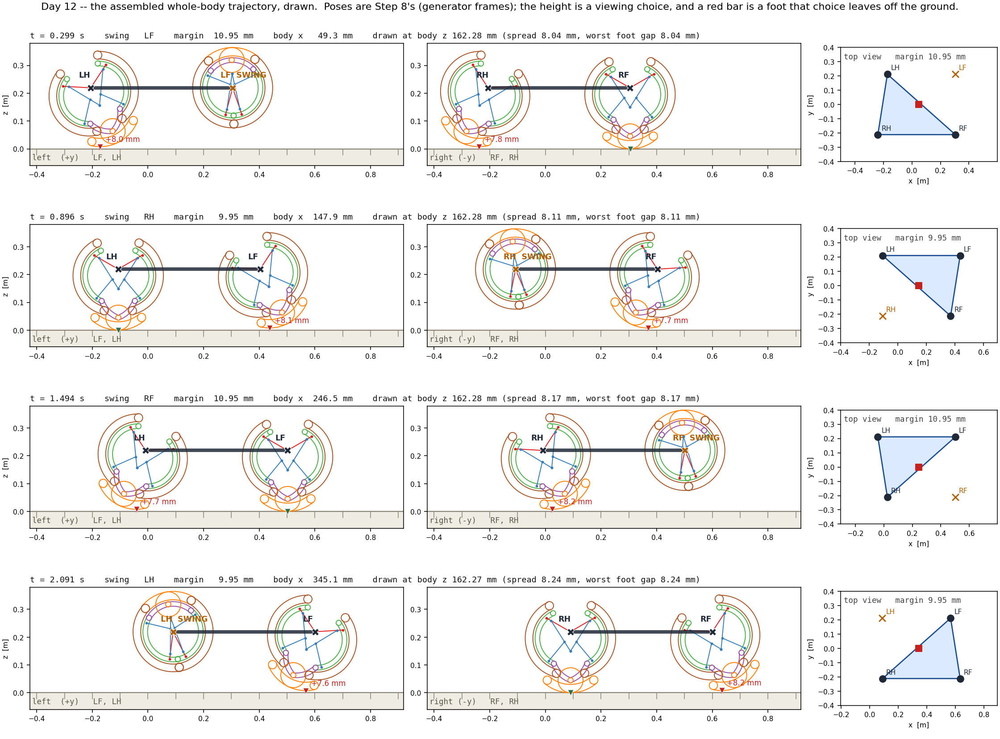

In [77]:
display(Image(filename=str(DAY12 / "day12_whole_body_frames.png")))

## A.4 整趟 3 秒

下面的時間軸：實心 = 站立、斜線 = 空中，紅線是 Step 6 的 stability margin，
虛線是 10 mm 的 floor。**四隻腳同時最多一隻在空中**（Step 3 的 duty 0.75 逼出來的）
在這裡是直接看得到的；margin 掉到 0 也是。

左下角固定印著這條軌跡**疊在什麼之上**——那三行是 `whole.assumptions` 算出來的，
不是圖說。

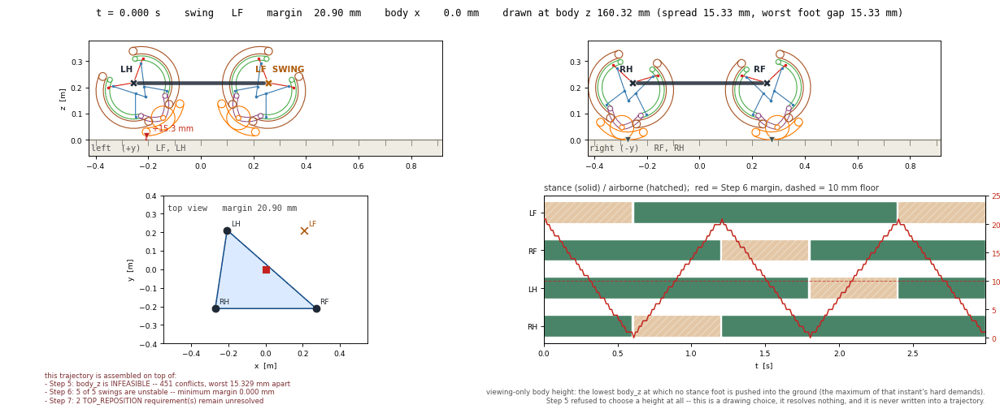

In [78]:
display(Image(filename=str(DAY12 / "day12_whole_body_animation.gif")))

## A.5 這張圖**不是**什麼

```text
不是可行性的證據   四個未解結論原封不動，就印在動畫左下角
不是實機時間       時間軸是 Step 3 的建模決定（duty 0.75），不是量到的物理時間
不是 CoM           粗黑線是 body，不是質心；這條 pipeline 沒有質量模型
不是新的量測       margin 來自 Step 6、姿態來自 Step 8、高度是畫圖挑的
```

它**是**什麼：Day 12 第一次可以用眼睛檢查「四隻腳合起來的規劃」有沒有明顯錯位——
而它第一眼就會告訴你，**每一個瞬間都有一隻腳浮在地面上方**。
那不是動畫的瑕疵，那是 Step 5 的 INFEASIBLE 長成的樣子。

重畫（約 50 秒，含 GIF）：

```bash
python3 -u LegWheel/hybrid_note/scripts/experiments/day12_animation_driver.py
```

In [79]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_whole_body_trajectory_2d.py",
     "tests/test_day12_whole_body_animation_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])

35 passed in 38.01s


---

# 附錄 B — 越障段的世界座標註冊

附錄 A 畫的是**平地**。要把越障也畫出來，第一件事不是畫地形，而是先問一個
到 Step 11 為止**沒有任何一步問過**的問題：

> 規劃出來的越障 swing，落在哪一個世界座標？

## B.1 為什麼這個問題到現在還沒有答案

Step 5 自己就寫著（`body_trajectory_2d` 的 docstring）：`body_x` 是從支撐腳的
**增量**積出來的，因為「Step 4 給每隻腳同一條 chain，它們的 `hip_x` 都從 0 開始，
**絕對值不共用原點**」。那是對的做法——但它同時把越障段自己的座標系丟掉了。

而地形只走到**決策**為止：`plan_terrain_2d` 把 terrain 餵給 `decide_2d` /
`compose_2d` 選策略，之後就沒有再往下傳；Step 8 又把接觸點放成**相對 hip**。

結果是組出來的軌跡**有 `SWING_UP` / `SWING_DOWN`，卻沒有障礙物**。
（附錄 A 提到「297 mm 的 chain break 看不到」是同一個機制的另一面。）

## B.2 註冊就是一個減法

一個越障 segment 知道自己座標系裡的 hip 起點與終點；軌跡知道那兩個瞬間那隻腳的
hip 實際在哪裡。差值就是位移，把 composition frame 的障礙物搬進世界：

```text
implied_x_start = world_hip_x - local_hip_x + COMPOSER_FRAME_X_START_M
```

`COMPOSER_FRAME_X_START_M` 現在是 `day10_11_composer_2d` 裡**具名的常數**，
不是散在三個函式裡的 `0.10`——要把越障放進世界的人需要的是那個數字本身。

在 segment 的**進入**與**離開**各算一次。如果這條越障放得進它被分到的排程窗口，
兩次會一樣，四隻腳也會彼此一樣，那就有**一個**平台。

In [80]:
from hybrid_note.scripts.experiments.day12_obstacle_registration_2d import (
    REGISTRATION_TOLERANCE_M, registration_report_2d, registration_rows,
    stance_on_top_seconds_2d,
)

# 與附錄 B 的圖同一組取樣（driver 用 241），數字才對得起來。
crossing_terrain = SharedTerrainSpec2D(
    height_m=0.04, top_length_m=0.40, x_start_m=1.00,
    obstacle_id="day12_platform")
crossing_run = plan_terrain_2d(crossing_terrain, tables10, samples=241,
                               reposition_unresolved=2)
registration = registration_report_2d(crossing_run.plan, crossing_run.body,
                                      crossing_terrain)
rB = registration.as_dict()

print(f"越障 segment 數                {rB['crossing_segments']}")
print(f"一個障礙物能同時符合它們嗎      {rB['is_registrable']}"
      f"   （容忍值 {rB['tolerance_mm']:.1f} mm，就是這條 pipeline 的接觸容忍值）")
print(f"隱含位置的散佈                 {rB['implied_spread_mm']:.1f} mm")
print(f"同一隻腳自己前後矛盾            {rB['worst_within_leg_gap_mm']:.1f} mm"
      f"   （它的 ascent 對它自己的 descent）")
print(f"單一 segment 內就漂移           {rB['worst_drift_mm']:.1f} mm")
print(f"最差的 body-advance 比值        {rB['worst_advance_ratio']:.1f}x"
      f"   <- segment 自己的座標系要 body 前進這麼多倍")
print(f"這個 run 規劃時用的平台在        {rB['planned_terrain_x_start_mm']:.0f} mm，"
      f"最近的隱含障礙物差 {rB['distance_to_planned_terrain_mm']:.0f} mm")

display(pd.DataFrame(registration_rows(registration))
        .query("row_kind == 'segment'")[
            ["leg", "kind", "start_s", "end_s", "implied_x_start_entry_mm",
             "implied_x_start_exit_mm", "drift_mm", "demanded_advance_mm",
             "delivered_advance_mm", "advance_ratio"]]
        .round(1).reset_index(drop=True))

越障 segment 數                8
一個障礙物能同時符合它們嗎      False   （容忍值 1.0 mm，就是這條 pipeline 的接觸容忍值）
隱含位置的散佈                 1045.3 mm
同一隻腳自己前後矛盾            436.2 mm   （它的 ascent 對它自己的 descent）
單一 segment 內就漂移           276.2 mm
最差的 body-advance 比值        17.3x   <- segment 自己的座標系要 body 前進這麼多倍
這個 run 規劃時用的平台在        1000 mm，最近的隱含障礙物差 349 mm


,leg,kind,start_s,end_s,implied_x_start_entry_mm,implied_x_start_exit_mm,drift_mm,demanded_advance_mm,delivered_advance_mm,advance_ratio
0,LF,SWING_UP,0.394475,0.497238,453.306833,177.062138,-276.244695,293.204203,16.959509,17.288485
1,LF,SWING_DOWN,0.497238,0.6,17.062138,-245.978354,-263.040491,280.0,16.959509,16.509912
2,RF,SWING_UP,1.594475,1.697238,651.350126,375.105431,-276.244695,293.204203,16.959509,17.288485
3,RF,SWING_DOWN,1.697238,1.8,215.105431,-47.935061,-263.040491,280.0,16.959509,16.509912
4,LH,SWING_UP,2.194475,2.297238,240.371772,-35.872923,-276.244695,293.204203,16.959509,17.288485
5,LH,SWING_DOWN,2.297238,2.4,-195.872923,-458.913414,-263.040491,280.0,16.959509,16.509912
6,RH,SWING_UP,0.994475,1.097238,42.328479,-233.916216,-276.244695,293.204203,16.959509,17.288485
7,RH,SWING_DOWN,1.097238,1.2,-393.916216,-656.956707,-263.040491,280.0,16.959509,16.509912


## B.3 結果：放不進去，而且不是差一點

八個越障 segment 隱含的障礙物位置散佈**超過一公尺**，同一隻腳的 ascent 與 descent
差 **436 mm**，而且**單一個 segment 內部**就漂移 276 mm。

漂移的來源是一句可以直接檢查的話：**這條 swing 的座標系假設 body 在它進行中前進
293 mm，排程只給了 17 mm**（17.3×）。

這正是 **Step 4 那個 `2.000x` 的距離版本**。Step 4 量的是時間放不下，
這裡量的是同一件事在空間上的樣子——而且距離版比時間版嚴重一個數量級。

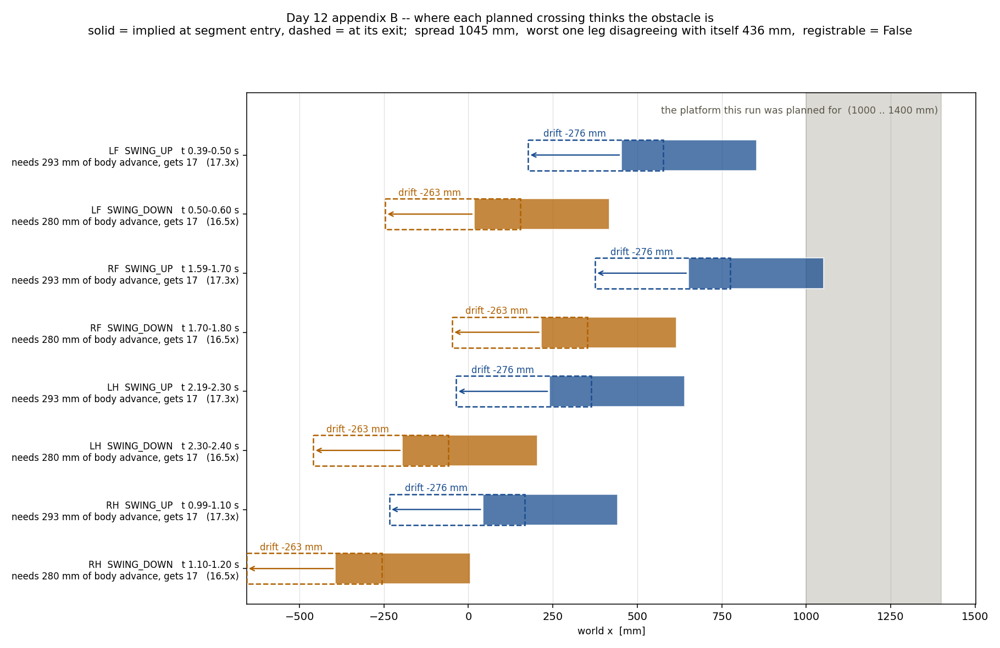

In [81]:
display(Image(filename=str(DAY12 / "day12_obstacle_registration.png")))

## B.4 註冊的過程順手抓到第二件事：**沒有任何一隻腳站上去過**

```text
在障礙物頂面【站立】的總時間 = 0.000 s
```

LF 的 `SWING_UP` 是 0.394–0.497 s，`SWING_DOWN` 是 **0.497**–0.600 s——
觸地與離地是**同一個瞬間**。兩者之間那 160 mm 的頂面移動
（composition frame 裡 260 mm 落地、420 mm 起跳），
就是 **Step 7 沒有解出來的 `TOP_REPOSITION`**。

所以這條軌跡「越過」障礙物的方式是：**跳上去、在同一瞬間跳下來**。
這不是動畫的取樣不夠密，是排程裡真的沒有那一段。

In [82]:
print(f"stance on top   {stance_on_top_seconds_2d(crossing_run.plan):.3f} s")
print()
lf = LEG_ORDER[0]
for sch in crossing_run.plan.schedule.segments_of(lf):
    seg = crossing_run.plan.plans[lf].phased[sch.segment_index].segment
    print(f"  {lf.value} {seg.kind.value:16s} {sch.mode.value:8s} "
          f"t {sch.start_s:6.3f}-{sch.end_s:6.3f} s   "
          f"接觸高度 {seg.start_contact.point_world_xz_m[1]*1e3:5.1f} -> "
          f"{seg.end_contact.point_world_xz_m[1]*1e3:5.1f} mm")
print("\n-> SWING_UP 的終點與 SWING_DOWN 的起點都在 +40 mm，且時間相同。"
      "\n   中間應該有的那一段是 Step 7 的 TOP_REPOSITION。")

stance on top   0.000 s

  LF FOOT_RIM_ROLL    STANCE   t -1.800- 0.000 s   接觸高度   0.0 ->   0.0 mm
  LF RECOVERY_SWING   AIRBORNE t  0.000- 0.394 s   接觸高度   0.0 ->   0.0 mm
  LF SWING_UP         AIRBORNE t  0.394- 0.497 s   接觸高度   0.0 ->  40.0 mm
  LF SWING_DOWN       AIRBORNE t  0.497- 0.600 s   接觸高度  40.0 ->   0.0 mm
  LF FOOT_RIM_ROLL    STANCE   t  0.600- 2.400 s   接觸高度   0.0 ->   0.0 mm
  LF RECOVERY_SWING   AIRBORNE t  2.400- 3.000 s   接觸高度   0.0 ->   0.0 mm

-> SWING_UP 的終點與 SWING_DOWN 的起點都在 +40 mm，且時間相同。
   中間應該有的那一段是 Step 7 的 TOP_REPOSITION。


## B.5 所以圖上**沒有平台**，而那是唯一誠實的畫法

- 畫在 1000 mm（這個 run 規劃時用的平台）：腳根本不會去那裡，差 349 mm；
- 畫在任何一個隱含位置：另外七個 segment 不同意，差最多 1045 mm。

所以畫出來的是**每一條 swing 自己宣稱的那個面**——紫色虛線的 `+40 mm`，
**下面什麼都沒有**。那條線是整張圖上唯一還記得有障礙物存在的東西。

其餘讀法與附錄 A 相同（body 高度是畫圖挑的、紅色是被那個高度留在空中的腳）。

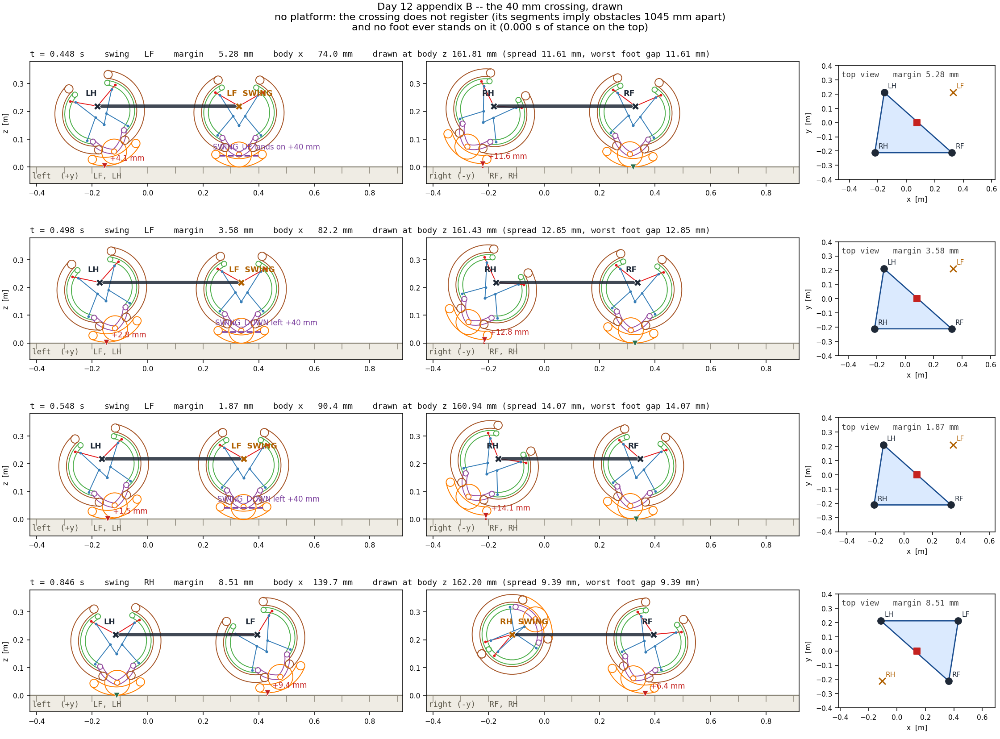

In [83]:
display(Image(filename=str(DAY12 / "day12_obstacle_frames.png")))

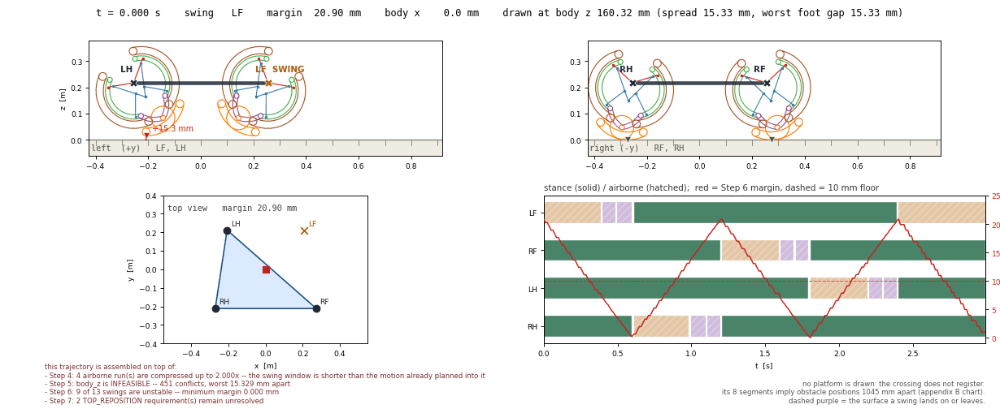

In [84]:
display(Image(filename=str(DAY12 / "day12_obstacle_animation.gif")))

## B.6 這一節交出去的三件事（都是 Day 13–14 的待辦，不是結論）

```text
1. 越障 swing 的 body-advance 需求要變成一個【排程約束】
   現在是 17.3x：段內要 293 mm，窗口給 17 mm。
   Step 4 的 2.000x 是同一個問題的時間側；兩個要一起解，不是各自放寬。

2. 需要頂面那一段（Step 7 的 TOP_REPOSITION）
   沒有它，「越障」是兩個【瞬間相接】的 swing，中間 160 mm 沒有人規劃。

3. 世界 x 註冊要變成 pipeline 的一部分
   terrain 現在只走到 decide / compose 為止。要讓四隻腳越過【同一個】障礙物，
   body_x 與越障段的座標系必須共用原點——這是一個建模決定，
   跟 Step 3 決定時間軸是同一種性質的決定。
```

重畫（約 70 秒，含 GIF；地形是參數，不是寫死的）：

```bash
python3 -u LegWheel/hybrid_note/scripts/experiments/day12_obstacle_animation_driver.py
python3 -u .../day12_obstacle_animation_driver.py --height-mm 100 --top-length-mm 400
```

In [85]:
import subprocess
proc = subprocess.run(
    ["python3", "-m", "pytest",
     "tests/test_day12_whole_body_animation_2d.py",
     "tests/test_day12_obstacle_registration_2d.py",
     "tests/test_day10_11_composer_2d.py", "-q"],
    cwd=ROOT, capture_output=True, text=True,
    env={**os.environ, "PYTEST_DISABLE_PLUGIN_AUTOLOAD": "1"},
)
print(proc.stdout.strip().splitlines()[-1])

37 passed in 48.01s
